# Unsupervised Machine Learning Project

## Part 1: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’ 

In [1]:
#importing the required libraries
import pandas as pd
import numpy as np

#compare ensemble to each baseline classifier
from numpy import mean
from numpy import std

import warnings
warnings.filterwarnings("ignore")

#For visualization
import seaborn as sns
import matplotlib.pyplot as plt  
sns.set(color_codes=True)        #adds color background (have to kill the kernel to see the changes of color)
%matplotlib inline 

#For scientific computations
from scipy import stats

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler            #For normalizing values

from scipy.stats import kendalltau                        #For hypothesis testing

from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans                        #To apply K means clustering
from scipy.stats import zscore
from scipy.spatial.distance import cdist                  #Finding optimal number of clusters

from sklearn.cluster import AgglomerativeClustering       #Hierarchical clustering
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist                  #Pairwise distribution between data points

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report,roc_auc_score
from sklearn import metrics

from sklearn.decomposition import PCA, IncrementalPCA

In [2]:
input1 = pd.read_csv('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Project 4 - USML\\Part1 - Car name.csv')
input1.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [3]:
input2 = pd.read_json('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Project 4 - USML\\Part1 - Car-Attributes.json')
input2.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [4]:
print('Shape of data file 1 is: {}'.format(input1.shape))
print('Shape of data file 2 is: {}'.format(input2.shape))

Shape of data file 1 is: (398, 1)
Shape of data file 2 is: (398, 8)


In [5]:
#Combining datasets
input0 = input2.copy()
input0['car name'] = input1
input0.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [6]:
print('Shape of final dataset is: {}'.format(input0.shape))

Shape of final dataset is: (398, 9)


### Saving final dataset in different formats

In [7]:
input0.to_csv('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Saving final data in csv format.csv',index=False)

In [8]:
input0.to_excel('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Saving final data in xlsx format.xlsx',index=False,sheet_name='Final data')

In [9]:
input0.to_json('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Saving final data in json format.json')

### Importing final dataset

In [10]:
data0 = pd.read_excel('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Saving final data in xlsx format.xlsx',sheet_name='Final data')
data0.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


### Data Cleansing

In [11]:
data0.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


In [12]:
data0.dtypes

mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
car name     object
dtype: object

Here we can see that 'hp' is represented as object. We can typecast this column to float for better analysis. 

In [13]:
# data0['hp'] = data0['hp'].astype(float, errors = 'raise')
# print(df.info())

Typecasting failed as it has encountered some non-numerical value '?' in 'hp' column

In [14]:
#check for unique values
data0['hp'].unique()

array([130, 165, 150, 140, 198, 220, 215, 225, 190, 170, 160, 95, 97, 85,
       88, 46, 87, 90, 113, 200, 210, 193, '?', 100, 105, 175, 153, 180,
       110, 72, 86, 70, 76, 65, 69, 60, 80, 54, 208, 155, 112, 92, 145,
       137, 158, 167, 94, 107, 230, 49, 75, 91, 122, 67, 83, 78, 52, 61,
       93, 148, 129, 96, 71, 98, 115, 53, 81, 79, 120, 152, 102, 108, 68,
       58, 149, 89, 63, 48, 66, 139, 103, 125, 133, 138, 135, 142, 77, 62,
       132, 84, 64, 74, 116, 82], dtype=object)

It is observed that we have irrelevant data like '?' is present in 'hp' column. Since these do not provide any information we can either remove them or we can use models which are better handlers of missing values.

In [15]:
data0.loc[(data0.hp == '?')]

,mpg,cyl,disp,hp,wt,acc,yr,origin,car name
32,25.0,4,98.0,?,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,?,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,?,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,?,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,?,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,?,3035,20.5,82,1,amc concord dl


#### These 6 rows can be removed and 'hp' column can be converted from object to float data type.

In [16]:
data1 = data0[data0.hp != '?']
data1['hp'] = data1['hp'].astype('float64',errors = 'raise')
data1.dtypes

mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin        int64
car name     object
dtype: object

In [17]:
data1.head(3)

,mpg,cyl,disp,hp,wt,acc,yr,origin,car name
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite


We can remove 'car name' column as it has little to no impact in predicting 'mpg'. 

In [18]:
data1.drop(['car name'], axis=1, inplace=True)
data1.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [19]:
print('Shape of dataset after removing car name column: {}'.format(data1.shape))

Shape of dataset after removing car name column: (392, 8)


#### Check for outliers and treat the same if required. We will use Z-score function defined in scipy library to detect the outliers.

In [20]:
z = np.abs(stats.zscore(data1))
print(z)

[[0.69863841 1.48394702 1.07728956 ... 1.285258   1.62531533 0.71664105]
 [1.08349824 1.48394702 1.48873169 ... 1.46672362 1.62531533 0.71664105]
 [0.69863841 1.48394702 1.1825422  ... 1.64818924 1.62531533 0.71664105]
 ...
 [1.09737414 0.86401356 0.56847897 ... 1.4304305  1.63640964 0.71664105]
 [0.5842277  0.86401356 0.7120053  ... 1.11008813 1.63640964 0.71664105]
 [0.96908753 0.86401356 0.72157372 ... 1.40043312 1.63640964 0.71664105]]


Defining a threshold to identify an outlier.

In [21]:
threshold = 3
print(np.where(z > 3))

(array([  6,   8,  13,  94, 115, 297, 388], dtype=int64), array([3, 3, 3, 3, 3, 5, 5], dtype=int64))


It's observed that there is a total of 7 outlier values in the dataset. Outliers are present in horsepower and acceleration column. Let's cross check whether Z-score is > 3 in 6th row of hp column.

In [22]:
print(z[6][3])

3.0053200647098826


Cleaning the data by removing outliers (using Z-score calculated above)

In [23]:
data2 = data1[(z < 3).all(axis=1)]
print('Shape of dataset before removing outliers: {}'.format(data1.shape))
print('Shape of dataset after removing outliers:  {}'.format(data2.shape))

Shape of dataset before removing outliers: (392, 8)
Shape of dataset after removing outliers:  (385, 8)


### Data analysis and Visualization

In [24]:
# Since 'mpg' is our target variable, we will rearrange the columns for convenience

data3 = data2.pop('mpg')
data2['mpg'] = data3
data2.describe().T

,count,mean,std,min,25%,50%,75%,max
cyl,385.0,5.446753,1.693399,3.0,4.0,4.0,8.0,8.0
disp,385.0,191.564935,101.457611,68.0,105.0,146.0,260.0,440.0
hp,385.0,103.127273,36.157885,46.0,75.0,92.0,122.0,215.0
wt,385.0,2963.114286,841.114175,1613.0,2223.0,2790.0,3605.0,5140.0
acc,385.0,15.567013,2.625333,8.0,13.9,15.5,17.0,23.7
yr,385.0,76.018182,3.656783,70.0,73.0,76.0,79.0,82.0
origin,385.0,1.581818,0.809566,1.0,1.0,1.0,2.0,3.0
mpg,385.0,23.505455,7.726938,9.0,17.5,23.0,29.0,46.6


It is observed that cylinders, year and origin are having categorical data.

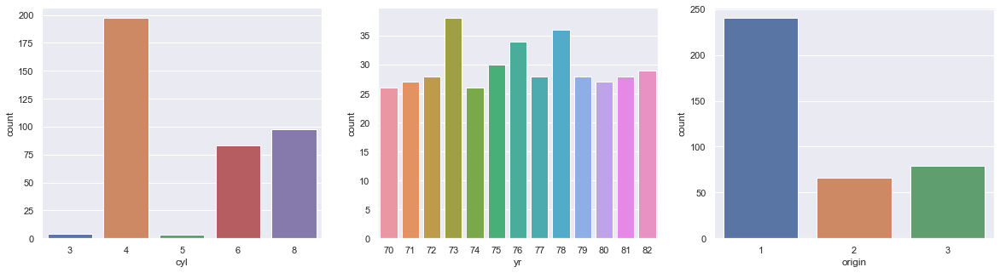

In [25]:
# Univariate Analysis

# Distribution of categorical variables

plt.figure(figsize= (20,5));

plt.subplot(1,3,1);
sns.countplot(data2['cyl']);

plt.subplot(1,3,2);
sns.countplot(data2['yr']);

plt.subplot(1,3,3);
sns.countplot(data2['origin']);

#### From the above plots we can observe that: 
- Vehicles with 3 and 5 cylinders are very less and count is below 10, vehicles having 6 and 8 cylinders are having count less than 100 but above 75. 4 cylindered vehicles are used the most with count almost reaching 200. 
- We have vehicle data from the year 1970 to 1982. An average of 28-30 vehicles are manufactured each year from 1970 till 1982. Around 38 vehicles are manufactured in the year 1973 alone.
- Origin mostly represents car make country. Most of the cars, i.e., around 245 cars are made in country 1. Around 60-70 are made in country 2 and 3.

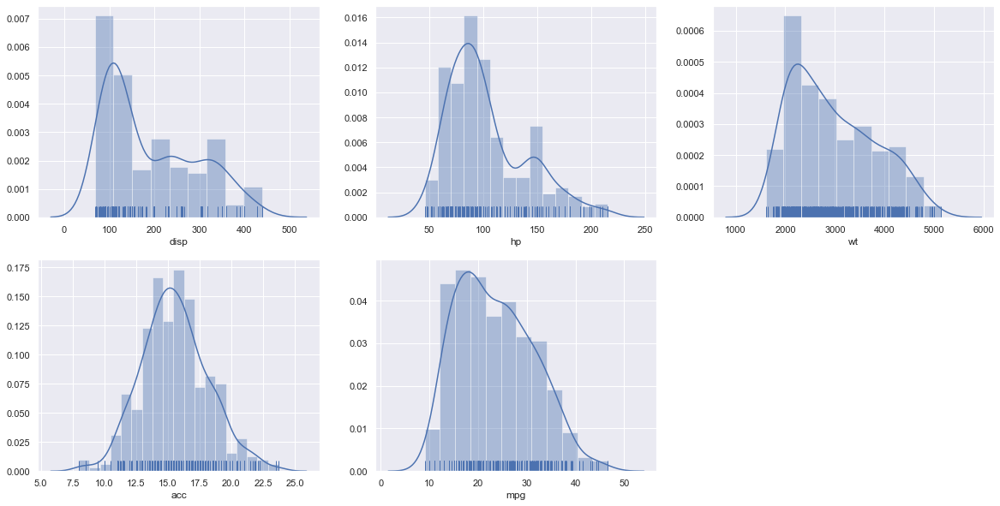

In [26]:
# Distribution of other numerical columns.

plt.figure(figsize= (20,10));

plt.subplot(2,3,1);
sns.distplot(data2['disp'],rug=True);

plt.subplot(2,3,2);
sns.distplot(data2['hp'],rug=True);

plt.subplot(2,3,3);
sns.distplot(data2['wt'],rug=True);

plt.subplot(2,3,4);
sns.distplot(data2['acc'],rug=True);

plt.subplot(2,3,5);
sns.distplot(data2['mpg'],rug=True);


#### From the above distribution plots we can observe that: 
- Cars having displacement ranging from 100-200 are comparitively higher than other ranges. 
- Similar to displacement, cars with lower hp are more compared to others, i.e., when hp ranges around 75-125. 
- When it comes to weight distribution is slightly skewed to the right. 
- Distribution of acceleration data follows more or less normal distribution. 
- Distribution of our target variable is not completely skewed but most of the cars are having range from 15 mpg to 35 mpg.

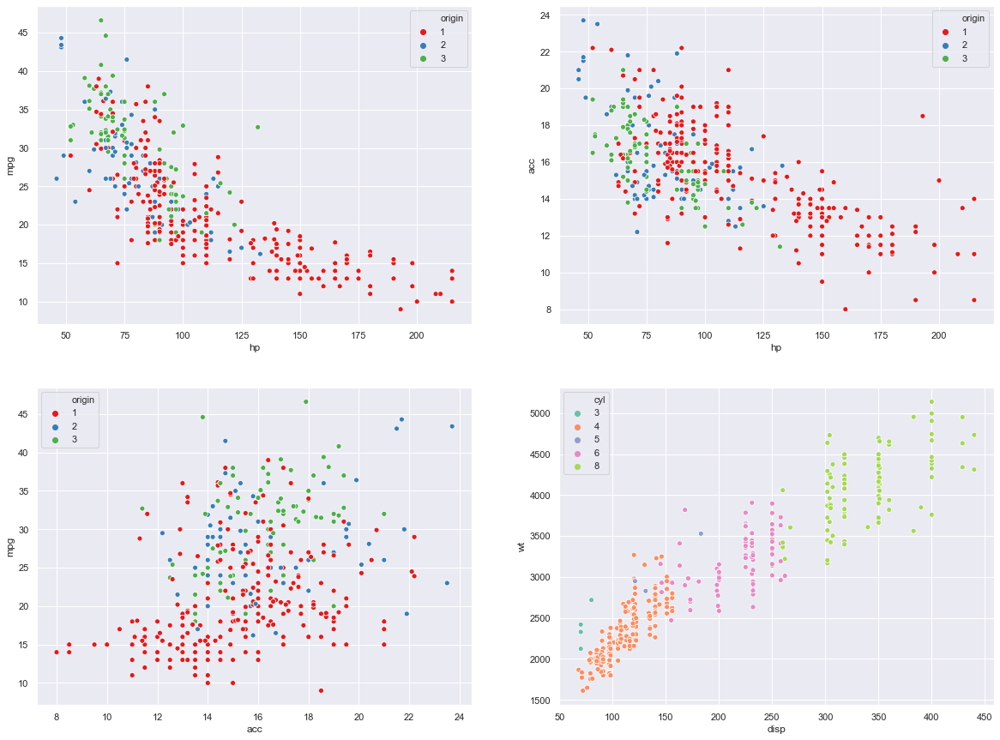

In [27]:
#Bivariate analysis
plt.figure(figsize= (20,15));

plt.subplot(2,2,1);
sns.scatterplot(data=data2, x="hp", y="mpg", hue="origin",palette="Set1");

plt.subplot(2,2,2);
sns.scatterplot(data=data2, x="hp", y="acc", hue="origin",palette="Set1");

plt.subplot(2,2,3);
sns.scatterplot(data=data2, x="acc", y="mpg", hue="origin",palette="Set1");

plt.subplot(2,2,4);
sns.scatterplot(data=data2, x="disp", y="wt", hue="cyl",palette="Set2");

#### Assumptions from above scatterplots:
- Target variable 'mpg' is closely related to 'hp'. It is observed that cars with lower horsepower gives better mileage (miles per gallon). As 'hp' increases 'mpg' decreases and thus both are inversely proportional. Cars with higher 'hp' are mostly originated from origin country 1. 
- Horsepower and acceleration are also somewhat related to each other. Cars with higher 'hp' tend to have lower acceleration except for few cases. All 3 countries make cars which have higher acceleration and higher hp. 
- The datapoints in plot 3 are spread irregularly. Thus, there is no/very less relation between 'mpg' and 'acc'. 
- From scatterplot 4 it is clear that weight, displacement and number of cylinders are closely related to each other. Here as the number of cylinders increases displacement and weight also increases. Thus, all 3 columns are directly proportional to each other.

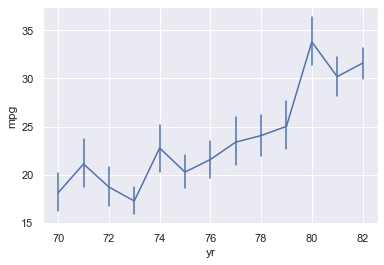

In [28]:
sns.lineplot(data=data2, x="yr", y="mpg",err_style="bars");

Above lineplot tells us that car manufacturers are more focused on improving 'mpg' over the years. It is evident that 'mpg' is increasing year by year though it's not in a linear way.(The bar at each year represents 95% CI).

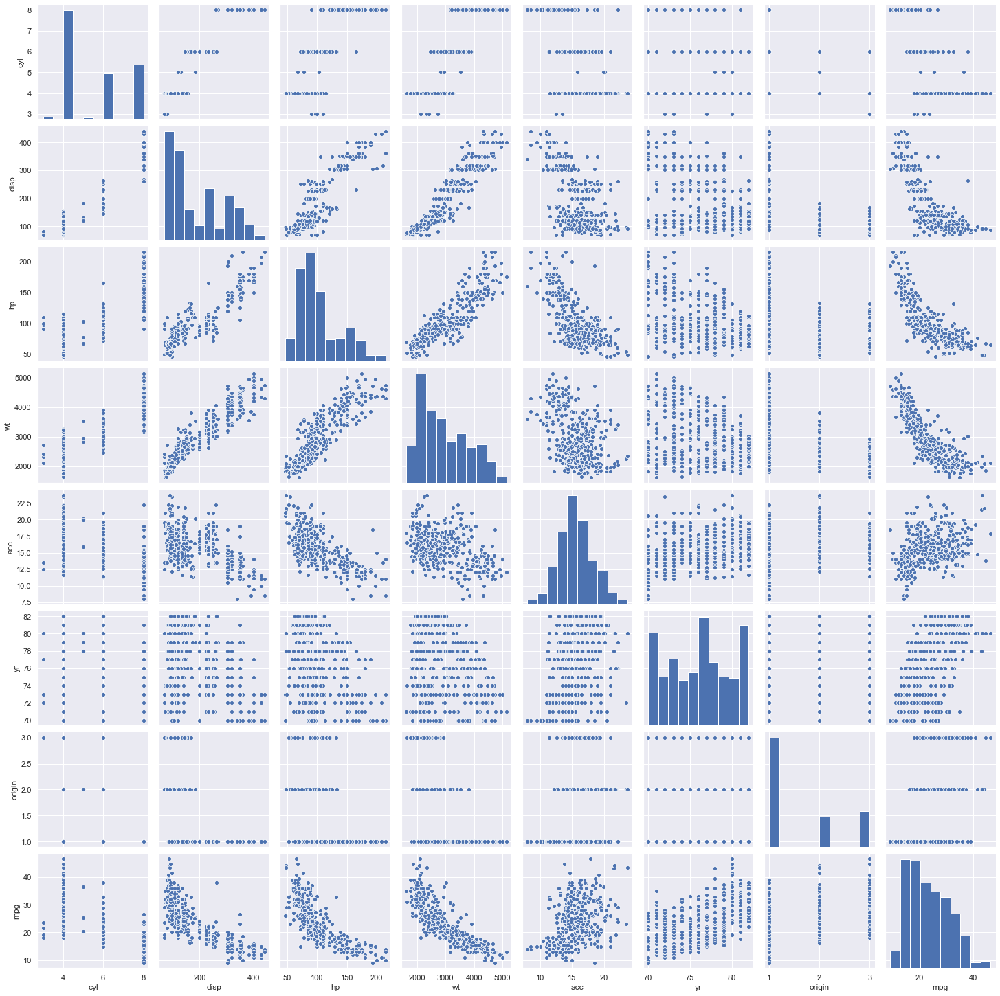

In [29]:
# Multivariate analysis
sns.pairplot(data2);

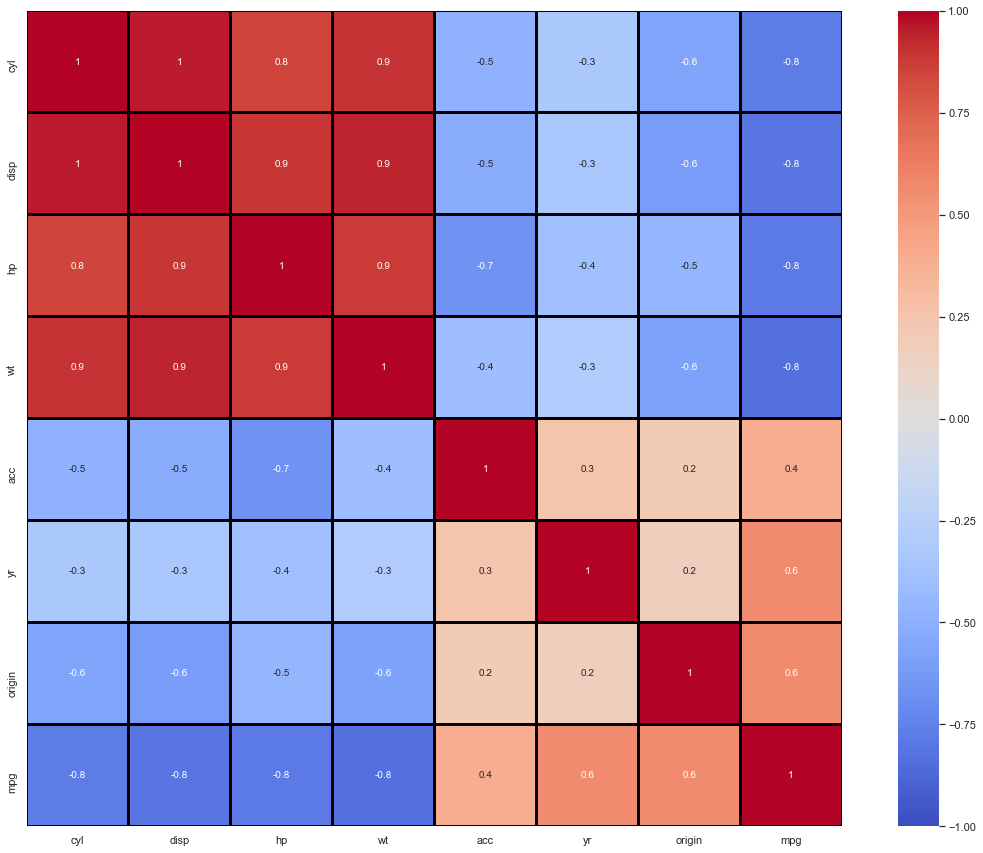

In [30]:
corrMat=data2.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corrMat, annot=True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', 
            linewidths=2, linecolor='black', square=True, );

#### Observations from pairplot and correlation matrix:
- Target variable 'mpg' is inversely proportional to number of cylinders, displacement, horsepower and weight. 
- As the number of cylinders increases displacement, hp and weight of the car also increases, thus making these 4 features directly proportional to each other. 
- Displacement is directly proportional to number of cylinders and these two seems to have strongest correlation.
- Acceleration doesn't seem to have strong correlation with any of the given features and same holds true for categorical features year and origin of the car.

#### Hypothesis testing to get more clarity on above visualizations

Let us use Kendall's Tau on 'mpg' and 'hp' columns since both the features have continuous data and follow monotonicity

In [31]:
Ho = "Mileage 'mpg' and Horsepower 'hp' are independent of each other."        #Null hypothesis
Ha = "Mileage 'mpg' and Horsepower 'hp' are dependent on each other."          #Alternate hypothesis

stat, p_value = kendalltau(data2['mpg'],data2['hp'])

#Assuming confidence interval as 95%
if p_value < 0.05:
    print(f'{Ha} as the p_value ({p_value}) < 0.05 and thus null hypothesis is rejected.')
else:
    print(f'{Ho} as the p_value ({p_value}) > 0.05 and thus null hypothesis is accepted.')

Mileage 'mpg' and Horsepower 'hp' are dependent on each other. as the p_value (1.0628981158086029e-83) < 0.05 and thus null hypothesis is rejected.


The same holds true for number of cylinders, displacement and weight features as they are directly proportional to horsepower.

### Machine learning:

For better analysis let us scale the data.

Text(0.5, 1.0, 'Choosing k using Elbow method')

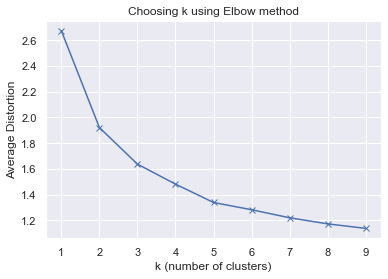

In [32]:
data_s = data2.apply(zscore)

#K means clustering

cluster=range(1,10)
meandistortions=[]

for k in cluster:
    model=KMeans(n_clusters=k)
    model.fit(data_s)
    prediction=model.predict(data_s)
    meandistortions.append(sum(np.min(cdist(data_s, model.cluster_centers_, 'euclidean'), axis=1)) / data_s.shape[0])


plt.plot(cluster, meandistortions, 'bx-')
plt.xlabel('k (number of clusters)')
plt.ylabel('Average Distortion')
plt.title('Choosing k using Elbow method')

As we can see from the plot the sharp bend is observed when k=2 and k=5. We will apply both and check for better results.

In [33]:
#When k=2

km1_model=KMeans(2)
km1_model.fit(data_s)
prediction1=km1_model.predict(data_s)

#Append the prediction
data3 = data2.copy()
data3["Group"] = prediction1
data3.head(15)

,cyl,disp,hp,wt,acc,yr,origin,mpg,Group
0,8,307.0,130.0,3504,12.0,70,1,18.0,1
1,8,350.0,165.0,3693,11.5,70,1,15.0,1
2,8,318.0,150.0,3436,11.0,70,1,18.0,1
3,8,304.0,150.0,3433,12.0,70,1,16.0,1
4,8,302.0,140.0,3449,10.5,70,1,17.0,1
5,8,429.0,198.0,4341,10.0,70,1,15.0,1
7,8,440.0,215.0,4312,8.5,70,1,14.0,1
9,8,390.0,190.0,3850,8.5,70,1,15.0,1
10,8,383.0,170.0,3563,10.0,70,1,15.0,1
11,8,340.0,160.0,3609,8.0,70,1,14.0,1


In [34]:
count_km1 = data3['Group'].value_counts()
count_km1

0    222
1    163
Name: Group, dtype: int64

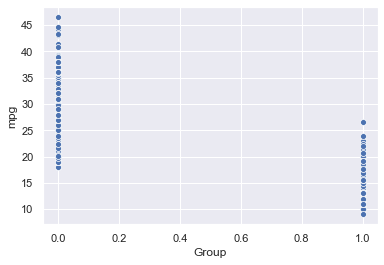

In [35]:
sns.scatterplot(data=data3, x="Group", y="mpg");

We can observe that cars with lower 'mpg' are grouped under label '0' and those with higher 'mpg' are grouped under label '1'.

In [36]:
#When k=5

km2_model=KMeans(5)
km2_model.fit(data_s)
prediction2=km2_model.predict(data_s)

#Append the prediction
data4 = data2.copy()
data4["Group"] = prediction2
data4.head(15)

,cyl,disp,hp,wt,acc,yr,origin,mpg,Group
0,8,307.0,130.0,3504,12.0,70,1,18.0,2
1,8,350.0,165.0,3693,11.5,70,1,15.0,2
2,8,318.0,150.0,3436,11.0,70,1,18.0,2
3,8,304.0,150.0,3433,12.0,70,1,16.0,2
4,8,302.0,140.0,3449,10.5,70,1,17.0,2
5,8,429.0,198.0,4341,10.0,70,1,15.0,2
7,8,440.0,215.0,4312,8.5,70,1,14.0,2
9,8,390.0,190.0,3850,8.5,70,1,15.0,2
10,8,383.0,170.0,3563,10.0,70,1,15.0,2
11,8,340.0,160.0,3609,8.0,70,1,14.0,2


In [37]:
count_km2 = data4['Group'].value_counts()
count_km2

2    91
3    83
1    78
0    69
4    64
Name: Group, dtype: int64

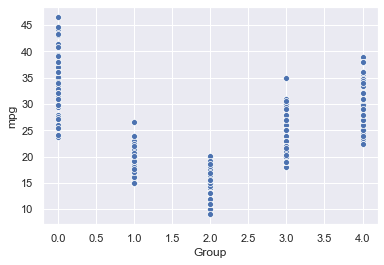

In [38]:
sns.scatterplot(data=data4, x="Group", y="mpg");

Here we can observe that cars with lowest 'mpg' are grouped under label '0' and those with highest 'mpg' are grouped under label '1'. While other groups have mid range 'mpg'.

In [39]:
#Hierarchical clustering

#When k=2

model = AgglomerativeClustering(n_clusters=2, affinity='euclidean',  linkage='average')
model.fit(data_s)

AgglomerativeClustering(linkage='average')

In [40]:
data5 = data2.copy()
data5['Group'] = model.labels_
data5.head(15)

,cyl,disp,hp,wt,acc,yr,origin,mpg,Group
0,8,307.0,130.0,3504,12.0,70,1,18.0,0
1,8,350.0,165.0,3693,11.5,70,1,15.0,0
2,8,318.0,150.0,3436,11.0,70,1,18.0,0
3,8,304.0,150.0,3433,12.0,70,1,16.0,0
4,8,302.0,140.0,3449,10.5,70,1,17.0,0
5,8,429.0,198.0,4341,10.0,70,1,15.0,0
7,8,440.0,215.0,4312,8.5,70,1,14.0,0
9,8,390.0,190.0,3850,8.5,70,1,15.0,0
10,8,383.0,170.0,3563,10.0,70,1,15.0,0
11,8,340.0,160.0,3609,8.0,70,1,14.0,0


In [41]:
count_ahc = data5['Group'].value_counts()
count_ahc

1    211
0    174
Name: Group, dtype: int64

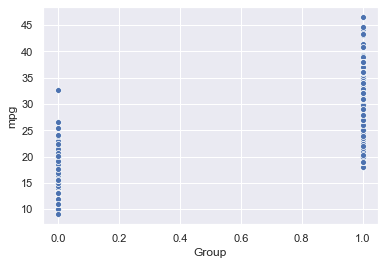

In [42]:
sns.scatterplot(data=data5, x="Group", y="mpg");

Cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
closer it is to 1, the better is the clustering. Let's try different linkage methods and plot dendogram for each.


In [43]:
#Linkage method = Complete

Z1 = linkage(data_s, metric='euclidean', method='complete')
c1, coph_dists1 = cophenet(Z1 , pdist(data_s))

print('Cophenetic correlation when complete linkage is used:  {}'.format(c1))

Cophenetic correlation when complete linkage is used:  0.6799347624809711


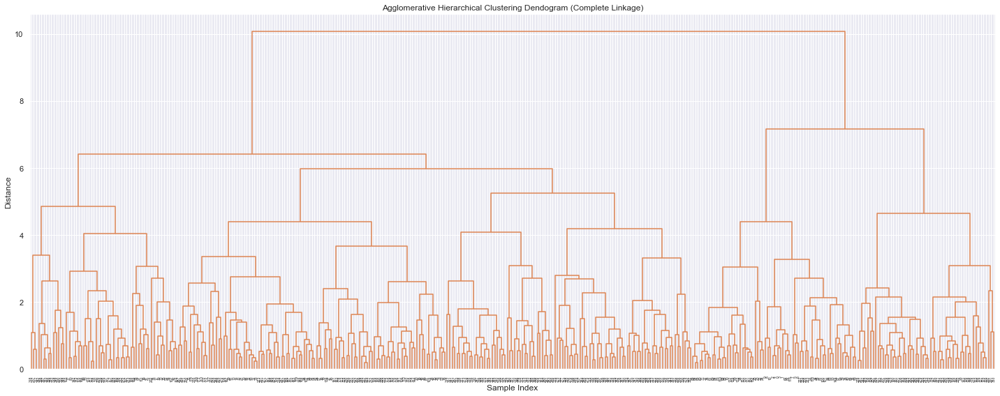

In [44]:
plt.figure(figsize=(20,8))
plt.title('Agglomerative Hierarchical Clustering Dendogram (Complete Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(Z1, leaf_rotation=90.,color_threshold = 400, leaf_font_size=5.)
plt.tight_layout()

In [45]:
#Linkage method = Average

Z2 = linkage(data_s, metric='euclidean', method='average')
c2, coph_dists1 = cophenet(Z2 , pdist(data_s))

print('Cophenetic correlation when average linkage is used:  {}'.format(c2))

Cophenetic correlation when average linkage is used:  0.7023355482997127


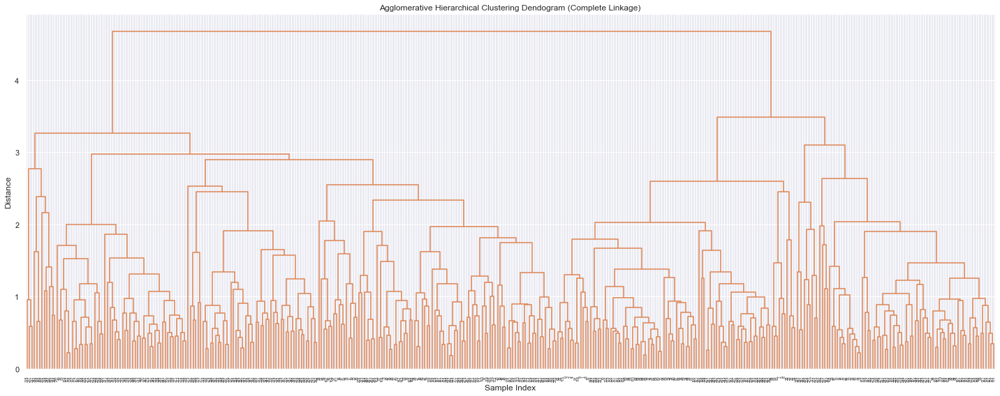

In [46]:
plt.figure(figsize=(20,8))
plt.title('Agglomerative Hierarchical Clustering Dendogram (Complete Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(Z2, leaf_rotation=90.,color_threshold = 400, leaf_font_size=5.)
plt.tight_layout()

In [47]:
#Linkage method = Ward

Z3 = linkage(data_s, metric='euclidean', method='ward')
c3, coph_dists1 = cophenet(Z3 , pdist(data_s))

print('Cophenetic correlation when average linkage is used:  {}'.format(c3))

Cophenetic correlation when average linkage is used:  0.6870994443097064


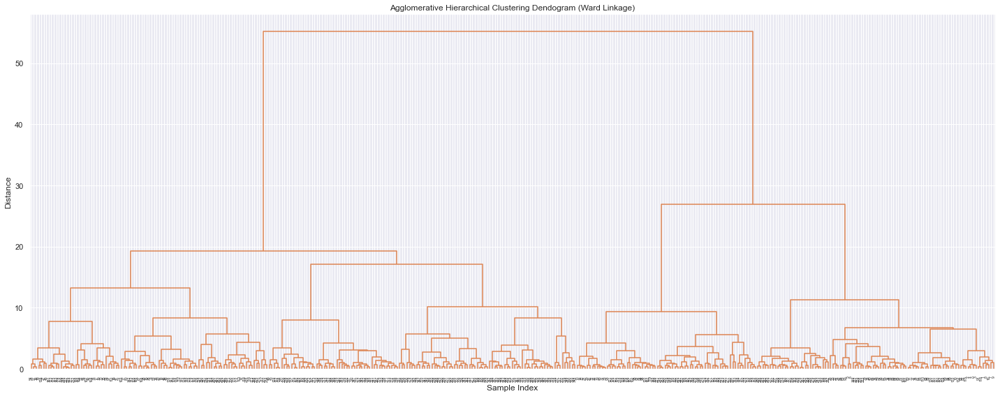

In [48]:
plt.figure(figsize=(20,8))
plt.title('Agglomerative Hierarchical Clustering Dendogram (Ward Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(Z3, leaf_rotation=90.,color_threshold = 400, leaf_font_size=5.)
plt.tight_layout()

From the above cophenetic index values and dendograms we can observe that 'Average Linkage' is providing best results. Thus we can use clusters = 2 and linkage = average for best results.

#### Deciding best fit clusters based on silhouette co-efficient.

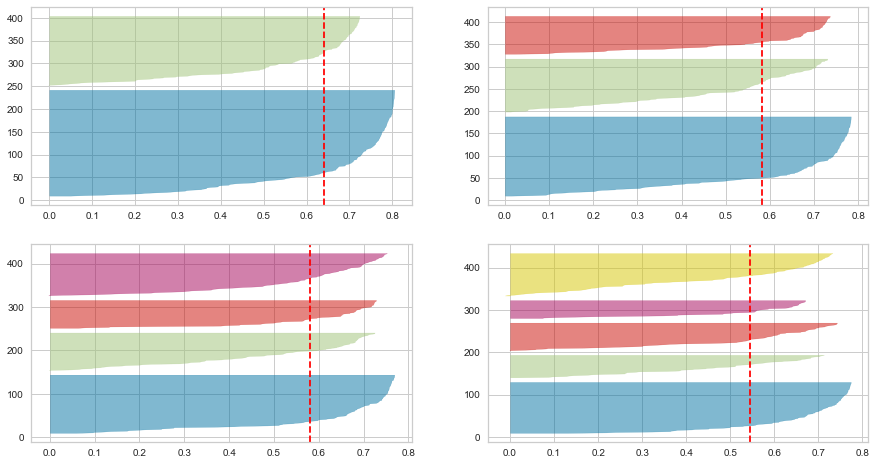

In [49]:
from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:

##Create KMeans instance for different number of clusters

    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=10)
    q, mod = divmod(i, 2)
    
##Create SilhouetteVisualizer instance with KMeans instance, Fit the visualizer

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(data2)

Silhouette score is the highest when there are 2 clusters which is approximately 0.64. Also the clusters are dense and nicely seperated when compared to other number of clusters.Thus, one can select the optimal number of clusters as 2.

### Conclusion: 
Both K-means clustering and Hierarchical clustering are easy to implement. K-means clustering has an advantage over Hierarchical clustering when we have a large dataset since it is computationally faster. Hierarchical clustering is more informative and structured when compared to K-Means clustering.

While both clustering methods have their own pros and cons, K-Means clustering seems to be more suitable for large datasets, once optimal value for 'k' is decided by using Elbow method or Silhouette coefficient.

### Let's apply Linear Regressor on diferrent clusters

In [50]:
data_g1 = data5[data5.Group == 0]
data_g1['Group'].value_counts()

0    174
Name: Group, dtype: int64

In [51]:
data_g2 = data5[data5.Group == 1]
data_g2['Group'].value_counts()

1    211
Name: Group, dtype: int64

In [52]:
#For Group 0
X1 = data_g1.drop(['mpg'], axis=1)
# the dependent variable
y1 = data_g1['mpg']

# Split X and y into training and test set in 70:30 ratio

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.30, random_state=1)

In [53]:
#Fit Linear regression model
lreg1_model = LinearRegression()
lreg1_model.fit(X1_train, y1_train)

print("The coefficient for Group 0 is {}".format(lreg1_model.coef_[:]))

g1_train_score = lreg1_model.score(X1_train, y1_train)
g1_test_score = lreg1_model.score(X1_test, y1_test)

print('')
print('The score for Group 0 train and test data under Linear regression is:  {} and {}'.format(g1_train_score,g1_test_score))

The coefficient for Group 0 is [ 0.16391153  0.01118043 -0.03102068 -0.00333059  0.02887542  0.36968669
  0.79527456  0.        ]

The score for Group 0 train and test data under Linear regression is:  0.6936388965163605 and 0.665659825553983


In [54]:
#For Group 1
X2 = data_g2.drop(['mpg'], axis=1)
# the dependent variable
y2 = data_g2['mpg']

# Split X and y into training and test set in 70:30 ratio

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.30, random_state=1)

In [55]:
#Fit Linear regression model
lreg2_model = LinearRegression()
lreg2_model.fit(X2_train, y2_train)

print("The coefficient for Group 0 is {}".format(lreg2_model.coef_[:]))

g2_train_score = lreg2_model.score(X2_train, y2_train)
g2_test_score = lreg2_model.score(X2_test, y2_test)

print('')
print('The score for Group 1 train and test data under Linear regression is:  {} and {}'.format(g2_train_score,g2_test_score))

The coefficient for Group 0 is [ 0.98972018  0.00673681 -0.10477082 -0.00620006 -0.13846504  0.7733128
  0.80014032  0.        ]

The score for Group 1 train and test data under Linear regression is:  0.6725788102636561 and 0.6748873634064956


In [56]:
#For complete dataset
X3 = data2.drop(['mpg'], axis=1)
# the dependent variable
y3 = data2['mpg']

# Split X and y into training and test set in 70:30 ratio

X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.30, random_state=1)

In [57]:
#Fit Linear regression model
lreg3_model = LinearRegression()
lreg3_model.fit(X3_train, y3_train)
g3_train_score = lreg3_model.score(X3_train, y3_train)
g3_test_score = lreg3_model.score(X3_test, y3_test)

print('The score for original data under train and test Linear regression is:  {} and {}'.format(g3_train_score,g3_test_score))

The score for original data under train and test Linear regression is:  0.8208521224063139 and 0.8228323115821181


We can use different models on clusters to improve the prediction. Also, using models on individual clusters will definitely improve computational speed, especially when handling large datasets. If we use single model on a complete dataset then we might face space and computation time problems. Looking at the above scores it seems that when linear regression is applied for individual clusters accuracy is comparitively less. Whereas when linear regression is applied on original data the accuracy is approximately 82% for both train and test data. To improve scores we can use more efficient models like random forests and other ensemble techniques.

### Let's check cluster profiles for suggestions

In [58]:
data5.Group.value_counts().sort_index()

0    174
1    211
Name: Group, dtype: int64

In [59]:
# c_profile=data5.copy()
c_profile=data5.drop(['yr','origin'],axis=1)
c_profile = c_profile.groupby('Group').mean()
c_profile['count']=data5.Group.value_counts().sort_index()
c_profile

,cyl,disp,hp,wt,acc,mpg,count
Group,,,,,,,
0,7.126437,287.942529,131.505747,3727.143678,14.537356,16.863218,174
1,4.061611,112.087678,79.725118,2333.061611,16.416114,28.982938,211


- Group0 : More number of cylinders, higher displacement, More Horsepower, More weight, Similar acceleration, Low MPG.
- Group1 : Less number of cylinders, lower displacement, Less Horsepower, Less weight, Similar acceleration, High MPG.

From the above features of groups we can say that Group0 is more suitable for people looking for more horsepower in cars and Group1 is suitable for people looking for high mileage.

For a better data analysis the company can
- collect data having complete values instead of unknown values as found in 'hp' column.
- give more information on distance travelled using the cars as this will help to get predict accurate results.
- collect information on where the car is mostly driven (highways or cities), as this feature has high importance in determining the mileage.
- sometimes road conditions and climate of the place where the car is used can also affect 'mpg'. So it would be helpful to gain knowledge on these features as well.
- also fuel efficiency matters to determine the mileage of a car.

## Part 2: Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

Import the data

In [60]:
p2_input = pd.read_excel('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Project 4 - USML\\Part2 - Company.xlsx')
p2_input.head(10)

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A
5,153,140,154,199,NaN
6,34,28,78,22,Quality A
7,191,144,143,154,NaN
8,160,181,194,178,Quality B
9,145,178,158,141,NaN


In [61]:
print('Shape of data file is: {}'.format(p2_input.shape))

Shape of data file is: (61, 5)


In [62]:
p2_input.dtypes

A           int64
B           int64
C           int64
D           int64
Quality    object
dtype: object

A, B, C and D are integers and Quality is an object column.

In [63]:
p2_input.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

There are 18 NaN values in 'Quality' column

In [64]:
p2_input.describe().T

,count,mean,std,min,25%,50%,75%,max
A,61.0,118.557377,61.771494,3.0,61.0,136.0,171.0,200.0
B,61.0,116.639344,57.897908,5.0,63.0,138.0,168.0,200.0
C,61.0,114.081967,65.615368,3.0,59.0,135.0,174.0,200.0
D,61.0,114.459016,63.144431,3.0,51.0,132.0,174.0,199.0


In [65]:
# from sklearn.base import TransformerMixin

# # p2_input.dropna(inplace=True)

# class DataFrameImputer(TransformerMixin):

#     def __init__(self):
#         """
#         Impute missing values:
#         - Columns of dtype object are imputed with the most frequent value in column.
#         - Columns of other types are imputed with mean of column.
#         """
#     def fit(self, X, y=None):

#         self.fill = pd.Series([X[c].value_counts().index[0]
#             if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
#             index=X.columns)

#         return self

#     def transform(self, X, y=None):
#         return X.fillna(self.fill)

# p2_input1 = DataFrameImputer().fit_transform(p2_input)

In [66]:
p2_input.dtypes

A           int64
B           int64
C           int64
D           int64
Quality    object
dtype: object

In [67]:
from sklearn.ensemble import RandomForestRegressor

# p2_input['Quality'] = p2_input['Quality'].apply(lambda x: x.replace('Quality A', '0').replace('Quality B', '1')).astype('int')

p2_input['Quality'] = p2_input['Quality'].replace(['Quality A','Quality B'],['0','1'])
p2_input.head(10)

,A,B,C,D,Quality
0,47,27,45,108,0
1,174,133,134,166,1
2,159,163,135,131,NaN
3,61,23,3,44,0
4,59,60,9,68,0
5,153,140,154,199,NaN
6,34,28,78,22,0
7,191,144,143,154,NaN
8,160,181,194,178,1
9,145,178,158,141,NaN


In [68]:
p2_w_quality = p2_input[pd.isnull(p2_input['Quality']) == False]
p2_wo_quality = p2_input[pd.isnull(p2_input['Quality'])]

p2_wo_quality.head()

,A,B,C,D,Quality
2,159,163,135,131,NaN
5,153,140,154,199,NaN
7,191,144,143,154,NaN
9,145,178,158,141,NaN
14,186,142,146,174,NaN


In [69]:
features = ['A', 'B', 'C', 'D']

rfModel_age = RandomForestRegressor()
rfModel_age.fit(p2_w_quality[features], p2_w_quality['Quality'])

generatedQuality = rfModel_age.predict(X = p2_wo_quality[features])
p2_wo_quality['Quality'] = generatedQuality.astype('int')
p2_wo_quality.head()

,A,B,C,D,Quality
2,159,163,135,131,1
5,153,140,154,199,1
7,191,144,143,154,1
9,145,178,158,141,1
14,186,142,146,174,1


In [70]:
data0 = p2_w_quality
data0['Quality'] = data0['Quality'].replace(['0','1'],['Quality A','Quality B'])
data1 = p2_wo_quality
data1['Quality'] = data1['Quality'].replace([0,1],['Quality A','Quality B'])
data2 = data0.append(data1)
data2.reset_index(inplace=True)
data2.drop('index',inplace=True,axis=1)
data2.tail()

,A,B,C,D,Quality
56,188,178,175,162,Quality B
57,137,182,165,199,Quality B
58,88,39,9,102,Quality A
59,180,157,192,198,Quality B
60,157,135,135,156,Quality B


In [71]:
print('Shape of data file is: {}'.format(data2.shape))

Shape of data file is: (61, 5)


In [72]:
data2.isna().sum()

A          0
B          0
C          0
D          0
Quality    0
dtype: int64

In [73]:
data2.to_excel('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Random Forest Regressor output.xlsx',index=False,sheet_name='Imputed data')

Thus, we have used Random Forest regressor model to impute values in 'Quality' column. Generally Random Forest regressor is efficient compared to other models. Some of the advantages using this model include good predictive capabilities, suitable for large datasets, normalization is not required, handles missing data effectively, etc.,.

## Part 3:  Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using just the raw data.

In [74]:
p3_input = pd.read_csv('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Project 4 - USML\\Part3 - vehicle.csv')
p3_input.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [75]:
print('Shape of data file is: {}'.format(p3_input.shape))

Shape of data file is: (846, 19)


In [76]:
p3_input.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

We can see that all features are numeric except 'class' column.

In [77]:
p3_input.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


#### Missing value detection and treatment

In [78]:
p3_input.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

There are missing values in 14 columns of the dataset. We will check the importance of the column apply missing value treatment based on feature importance.

In [79]:
#Let's put all columns having missing value in a variable
miss_cols = p3_input.columns[p3_input.isnull().any()]
p3 = p3_input
p3[p3.isnull().any(axis=1)][miss_cols].head()

,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2
5,NaN,106.0,172.0,50.0,255.0,26.0,28.0,280.0,957.0,264.0,85.0,5.0,9.0,181.0
9,44.0,98.0,NaN,62.0,183.0,36.0,22.0,202.0,505.0,152.0,64.0,4.0,14.0,195.0
19,56.0,100.0,215.0,NaN,208.0,32.0,24.0,227.0,651.0,223.0,74.0,6.0,5.0,186.0
35,46.0,NaN,172.0,67.0,157.0,43.0,20.0,170.0,363.0,184.0,67.0,17.0,7.0,192.0
66,43.0,68.0,125.0,57.0,149.0,46.0,19.0,169.0,323.0,172.0,NaN,NaN,18.0,179.0


In [80]:
print('Shape of missing columns and rows is: {}'.format(p3[p3.isnull().any(axis=1)][miss_cols].shape))

Shape of missing columns and rows is: (33, 14)


#### Using KNN imputer to treat missing values

Since there are multiple rows and columns having missing values we will impute these using KNN imputer. KNN imputer can be more accurate than the mean, median or mode imputation methods. Since we are dealing with relatively small dataset computational speed is negligible.

In [81]:
from sklearn.impute import KNNImputer

X = p3.copy()
X['class'] = X['class'].apply(lambda x: x.replace('car', '0').replace('van', '1').replace('bus', '2')).astype('int')
imputer = KNNImputer(n_neighbors=3)
X1 = pd.DataFrame(imputer.fit_transform(X),columns = X.columns)

In [82]:
X1.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

Thus all the missing values have been imputed using KNN imputer.

In [83]:
X1.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,1.0
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,1.0
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,0.0
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,1.0
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,2.0


In [84]:
X1.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.000000,100.0,119.0
circularity,846.0,44.864066,6.170621,33.0,40.00,44.000000,49.0,59.0
distance_circularity,846.0,82.096927,15.772038,40.0,70.00,80.000000,98.0,112.0
radius_ratio,846.0,168.967691,33.466924,104.0,141.00,167.000000,195.0,333.0
pr.axis_aspect_ratio,846.0,61.690701,7.885861,47.0,57.00,61.000000,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.000000,10.0,55.0
scatter_ratio,846.0,168.838061,33.246877,112.0,146.25,157.000000,198.0,265.0
elongatedness,846.0,40.933806,7.811560,26.0,33.00,43.000000,46.0,61.0
pr.axis_rectangularity,846.0,20.582742,2.592138,17.0,19.00,20.000000,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.000000,159.0,188.0


#### Outlier Detection and Treatment

Let us plot boxplot on whole dataset to detect outliers if any

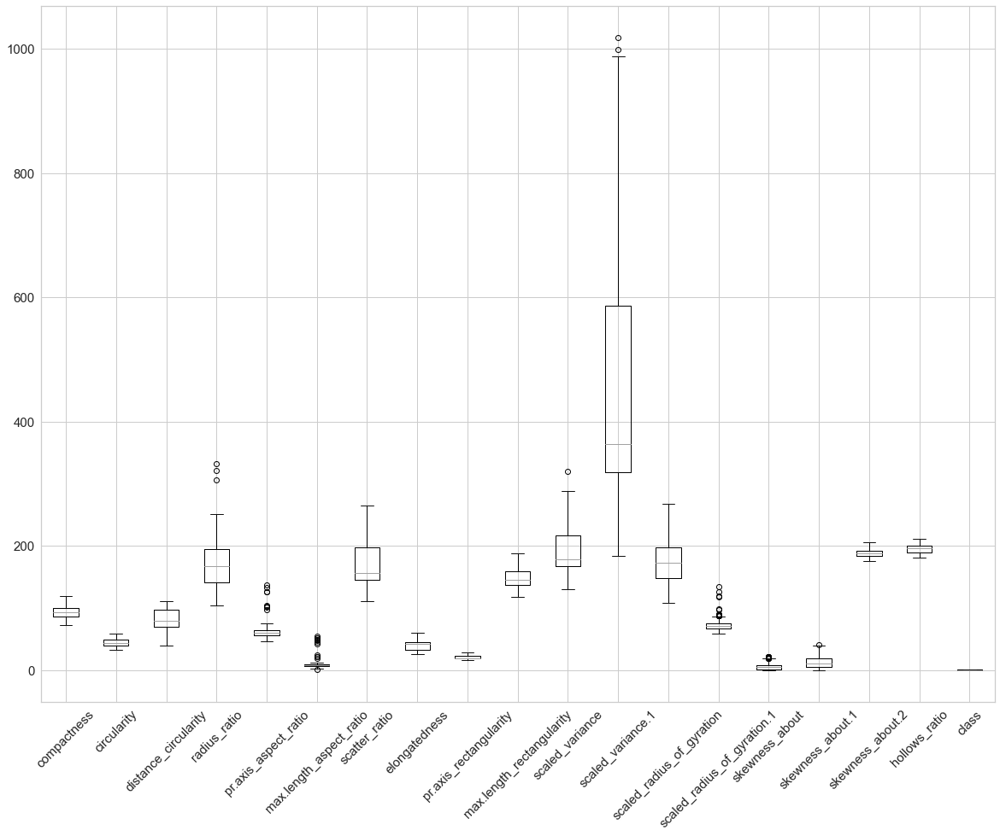

In [85]:
X1.boxplot(figsize=(20,15), rot=45, fontsize=15);

We can observe that there are outliers there are multiple outliers present in columns like radius_ratio, pr.axis_aspect ratio, max.length_aspect_ratio, scaled_ratio_of_gyration.1 and few other columns. We need to treat these outliers before proceeding as these might affect our final predictions.

#### Outlier treatment using Z score

In [86]:
z = np.abs(stats.zscore(X1))
print(z)

[[0.16058035 0.50850451 0.05729174 ... 0.31330886 0.18395733 0.29755491]
 [0.32546965 0.62657416 0.12073259 ... 0.01171787 0.45297703 0.29755491]
 [1.25419283 0.8328127  1.51643132 ... 0.1507955  0.04944748 0.89548514]
 ...
 [1.49721783 1.48142908 1.19922706 ... 0.31330886 0.72199673 0.89548514]
 [0.93303214 1.43734464 0.25991252 ... 0.17423123 0.08506238 0.89548514]
 [1.05454464 1.43734464 1.02120273 ... 0.47582222 0.75761164 0.29755491]]


Defining a threshold to identify an outlier.

In [87]:
threshold = 3
print(np.where(z > 3))

(array([  4,   4,   4,  37,  37,  37,  37,  44,  85, 100, 100, 100, 123,
       132, 135, 135, 135, 135, 291, 291, 321, 321, 388, 388, 388, 388,
       388, 391, 396, 513, 516, 523, 523, 623, 687, 687, 706, 706, 706,
       733, 761, 835, 835, 835], dtype=int64), array([ 4,  5, 13,  3,  4,  5, 13,  0, 11,  4,  5, 13, 14, 15,  3,  4,  5,
       13,  4,  5, 10, 11,  3,  4,  5, 10, 13,  5, 10, 15, 14,  4,  5, 14,
       10, 11,  4,  5, 13, 10, 14,  8, 10, 11], dtype=int64))


Cleaning the data by eliminating outliers (Using Z score calculated above)

In [88]:
X2 = X1[(z < 3).all(axis=1)]
print('Shape of dataset before removing outliers: {}'.format(X1.shape))
print('Shape of dataset after removing outliers:  {}'.format(X2.shape))

Shape of dataset before removing outliers: (846, 19)
Shape of dataset after removing outliers:  (824, 19)


It is observed that 22 rows are dropped after outlier treatment. Even though we lost some information this will help to predict more accurately. Let us again plot box plot to cross check outliers in the data.

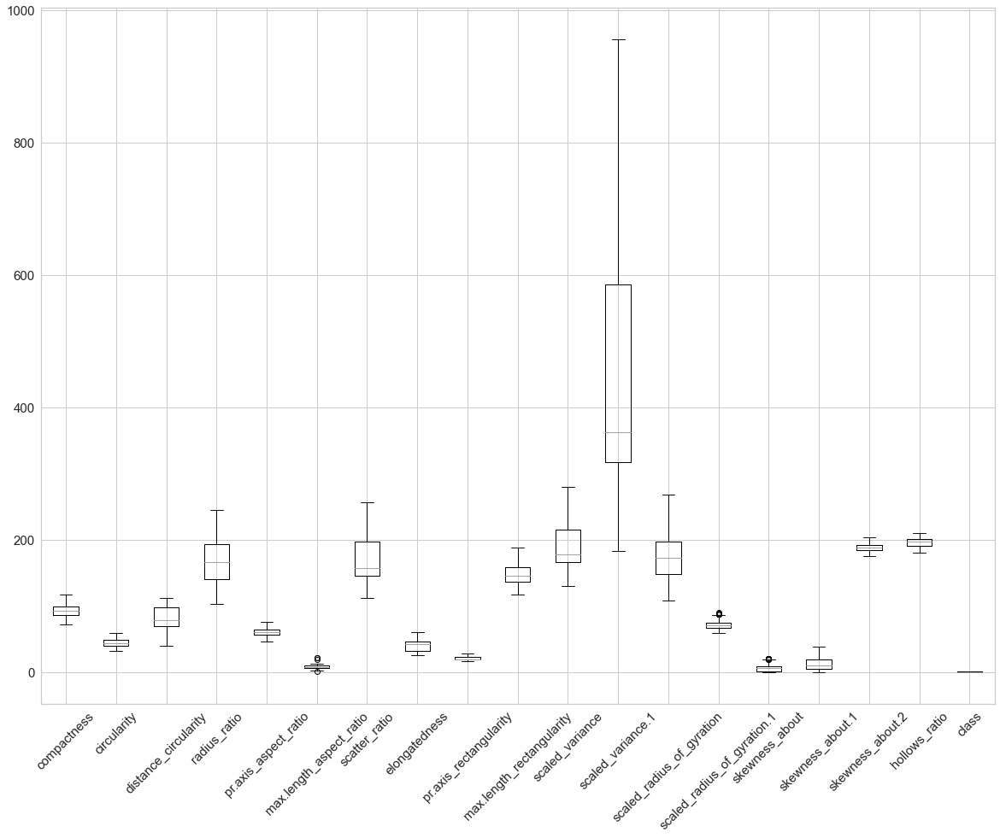

In [89]:
X2.boxplot(figsize=(20,15), rot=45, fontsize=15);

From the plot above we can see that most of the outliers are eliminated. Now we can proceed further with our analysis.

### Data Visualization and Analysis

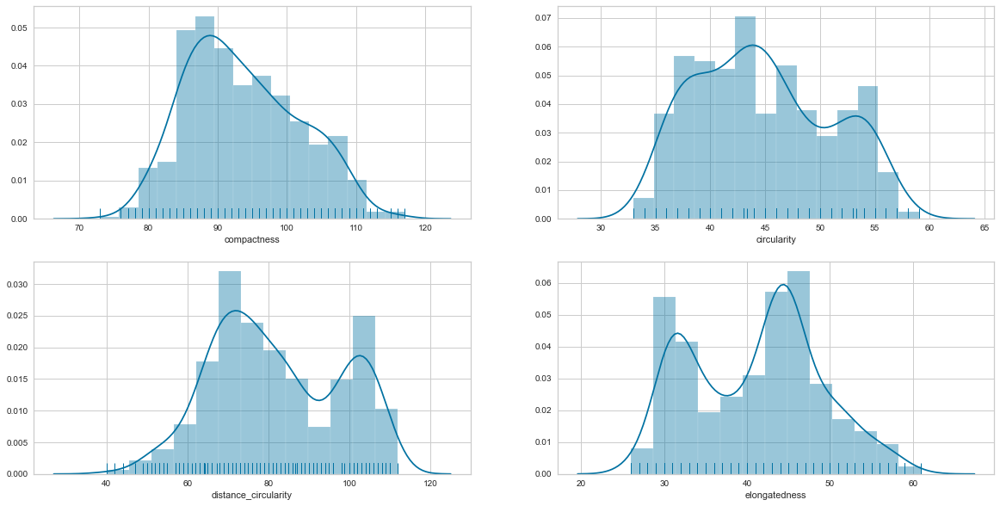

In [90]:
# Univariate Analysis

# Distribution numerical columns

plt.figure(figsize= (20,10));

plt.subplot(2,2,1);
sns.distplot(X2['compactness'],rug=True);

plt.subplot(2,2,2);
sns.distplot(X2['circularity'],rug=True);

plt.subplot(2,2,3);
sns.distplot(X2['distance_circularity'],rug=True);

plt.subplot(2,2,4);
sns.distplot(X2['elongatedness'],rug=True);

From the above distribution plots we can observe that none of the above features are neither skewed nor follows proper normal distribution. Only distribution of compactness is somewhat normal.

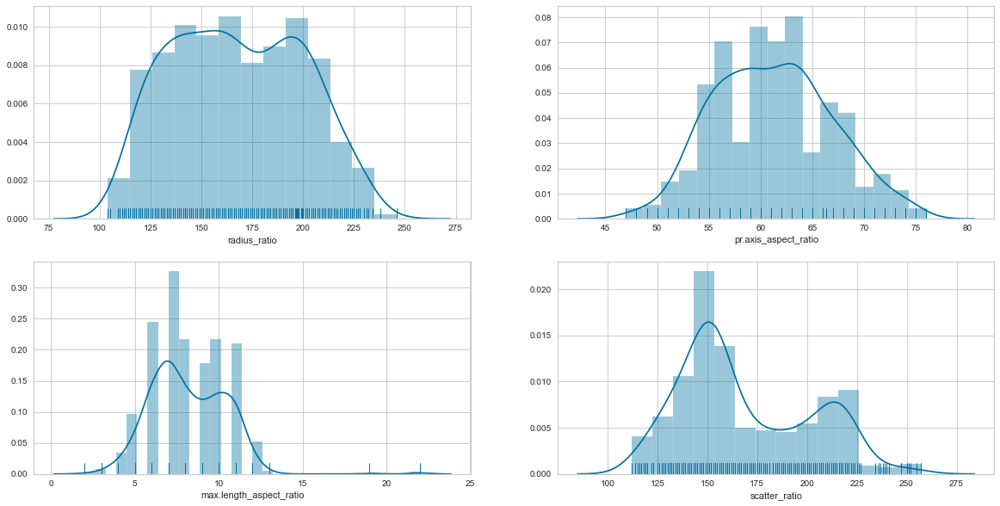

In [91]:
plt.figure(figsize= (20,10));

plt.subplot(2,2,1);
sns.distplot(X2['radius_ratio'],rug=True);

plt.subplot(2,2,2);
sns.distplot(X2['pr.axis_aspect_ratio'],rug=True);

plt.subplot(2,2,3);
sns.distplot(X2['max.length_aspect_ratio'],rug=True);

plt.subplot(2,2,4);
sns.distplot(X2['scatter_ratio'],rug=True);

From the above distribution plots we can observe that radius_ratio and pr.axis_axis_ratio follow near normal distribution whereas other two features have doesn't. Feature max.length_aspect_ratio has an extended tail probably because of few existing outliers.

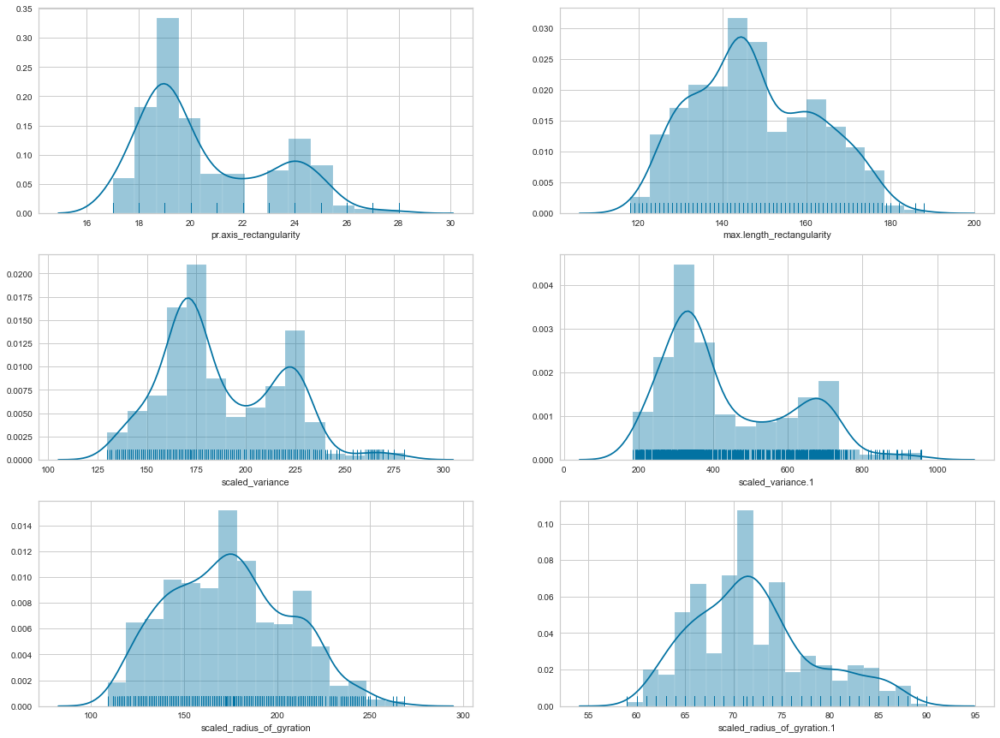

In [92]:
plt.figure(figsize= (20,15));

plt.subplot(3,2,1);
sns.distplot(X2['pr.axis_rectangularity'],rug=True);

plt.subplot(3,2,2);
sns.distplot(X2['max.length_rectangularity'],rug=True);

plt.subplot(3,2,3);
sns.distplot(X2['scaled_variance'],rug=True);

plt.subplot(3,2,4);
sns.distplot(X2['scaled_variance.1'],rug=True);

plt.subplot(3,2,5);
sns.distplot(X2['scaled_radius_of_gyration'],rug=True);

plt.subplot(3,2,6);
sns.distplot(X2['scaled_radius_of_gyration.1'],rug=True);

From the above distribution plots we can observe that scaled_radius_of_gyration columns follow near normal distribution. Other features have varied distribution and tails.

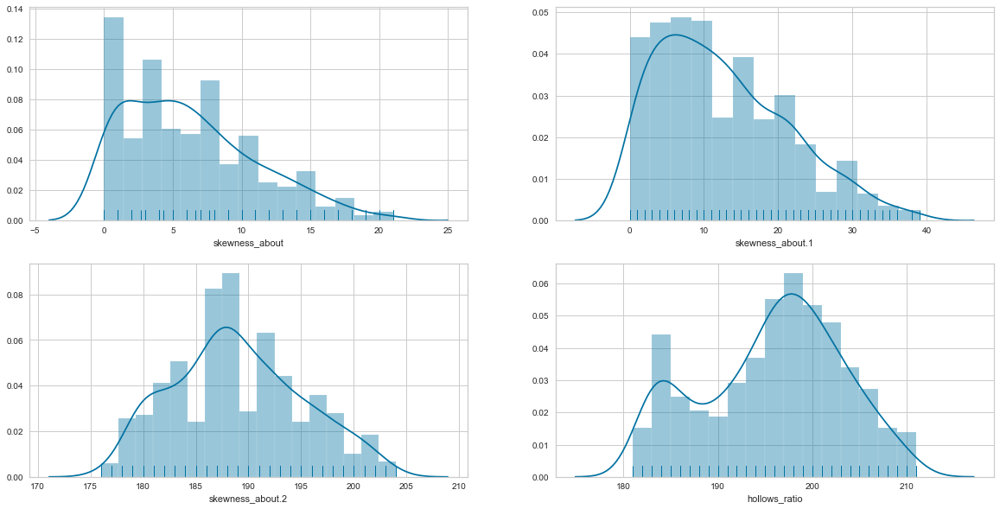

In [93]:
plt.figure(figsize= (20,10));

plt.subplot(2,2,1);
sns.distplot(X2['skewness_about'],rug=True);

plt.subplot(2,2,2);
sns.distplot(X2['skewness_about.1'],rug=True);

plt.subplot(2,2,3);
sns.distplot(X2['skewness_about.2'],rug=True);

plt.subplot(2,2,4);
sns.distplot(X2['hollows_ratio'],rug=True);

From the above distribution plots we can observe that skewness_about and skewness_about.1 are right skewed and skewness_about.2 is somewhat normal distribution. Feature hollows_ratio has varied distribution

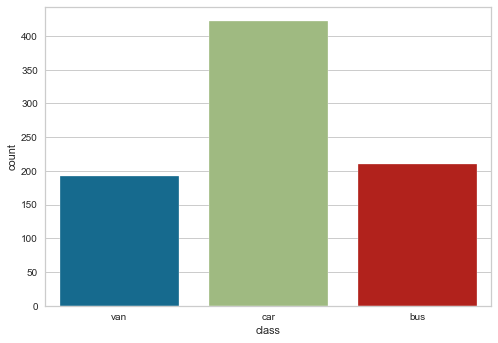

In [94]:
X3 = X2.copy()
X3['class'] = X3['class'].replace([0,1,2],['car','van','bus'])
sns.countplot(X3['class']);

As observed in the countplot, data comprises from over 400 cars, just under 200 vans and above 200 buses.

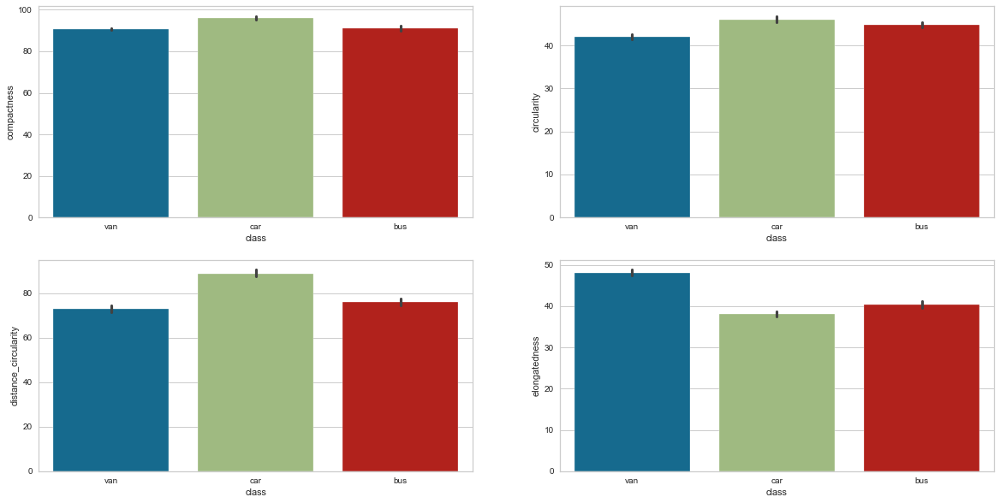

In [95]:
# Bivariate and Multivariate analysis

# Numerical variables against target variable

plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
sns.barplot(X3['class'], X3['compactness']);

plt.subplot(2,2,2)
sns.barplot(X3['class'], X3['circularity']);

plt.subplot(2,2,3)
sns.barplot(X3['class'], X3['distance_circularity']);

plt.subplot(2,2,4)
sns.barplot(X3['class'], X3['elongatedness']);

From the above bivariate plots we can observe that 
- 'compactness' and 'circularity' are almost same for all 3 class of vehicles. 
- Cars have highest 'distance_circularity' among the 3 whereas that of van and bus are almost same. 
- When it comes to 'elongatedness', van has the highest which is near 50 and that of car and bus are near 40.

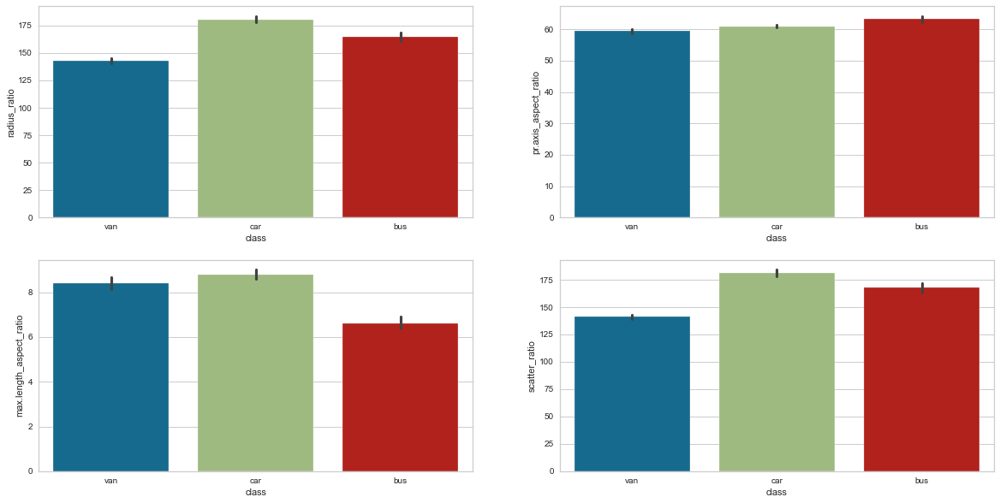

In [96]:
plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
sns.barplot(X3['class'], X3['radius_ratio']);

plt.subplot(2,2,2)
sns.barplot(X3['class'], X3['pr.axis_aspect_ratio']);

plt.subplot(2,2,3)
sns.barplot(X3['class'], X3['max.length_aspect_ratio']);

plt.subplot(2,2,4)
sns.barplot(X3['class'], X3['scatter_ratio']);

From the above plots we can observe that
- Features radius_ratio and scatter_ratio have similar distribution among classes, where cars have the highest, followed by bus and van respectively.
- Feature pr.axis_aspect_ratio has almost similar distribution in all 3 classes, except for bus has silghtly higher value.
- When it comes to max.length_aspect_ratio car has slightly higher value than van and bus have the least value among the 3.

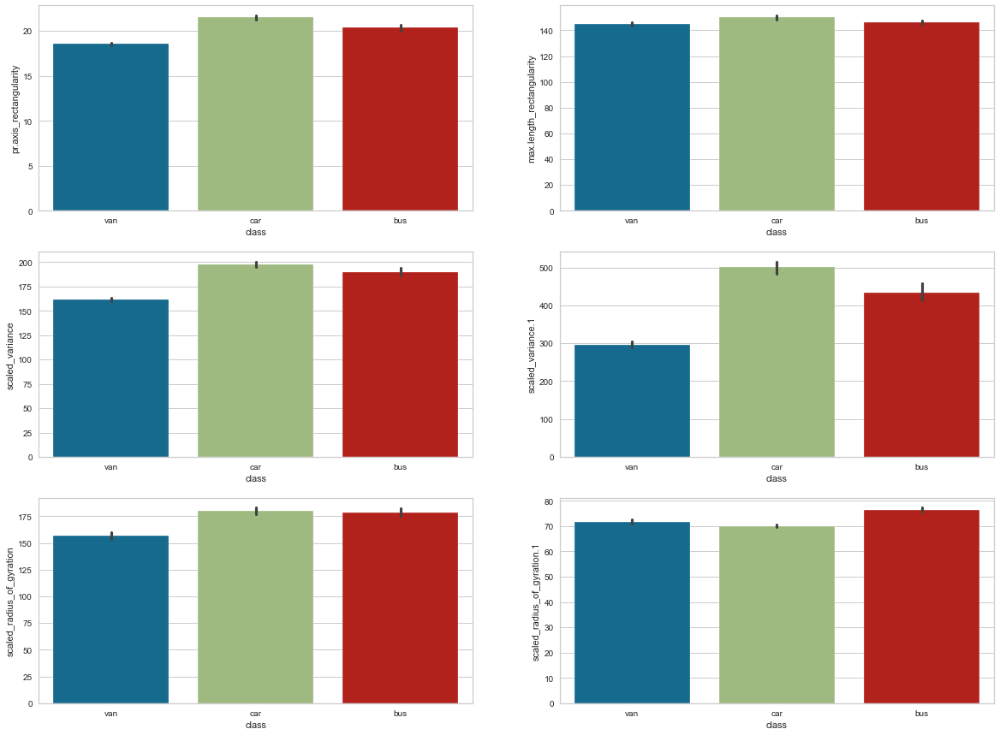

In [97]:
plt.figure(figsize=(20,15))

plt.subplot(3,2,1)
sns.barplot(X3['class'], X3['pr.axis_rectangularity']);

plt.subplot(3,2,2)
sns.barplot(X3['class'], X3['max.length_rectangularity']);

plt.subplot(3,2,3)
sns.barplot(X3['class'], X3['scaled_variance']);

plt.subplot(3,2,4)
sns.barplot(X3['class'], X3['scaled_variance.1']);

plt.subplot(3,2,5)
sns.barplot(X3['class'], X3['scaled_radius_of_gyration']);

plt.subplot(3,2,6)
sns.barplot(X3['class'], X3['scaled_radius_of_gyration.1']);

Observations from above plots:
- Features pr.axis_rectangularity, max.length_rectangularity, scaled_variance and scaled_variance.1 have somewhat similar distribution where class car has the highest values followed by bus and van.
- In scaled_radius_of_gyration, class car and class bus have almost same values and van has the least.
- Whereas class bus has highest value in scaled_radius_of_gyration.1 followed by class van and class car.

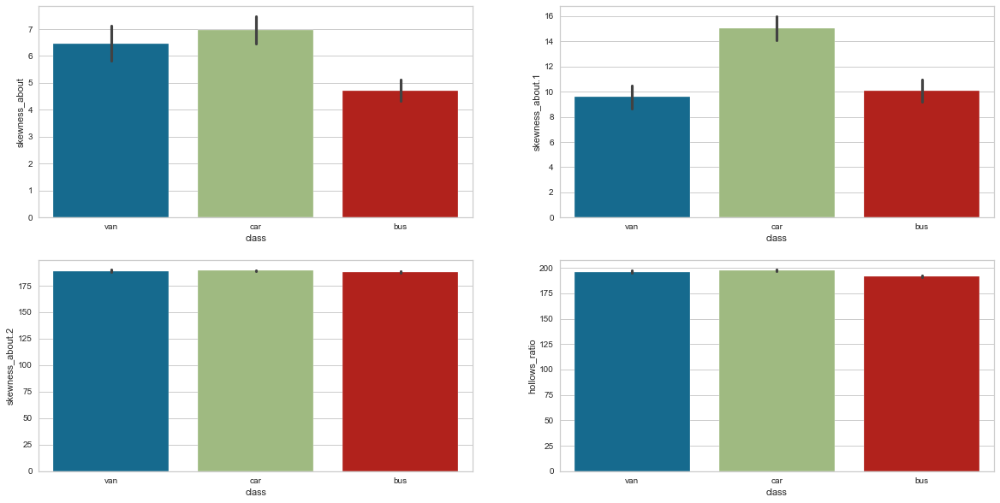

In [98]:
plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
sns.barplot(X3['class'], X3['skewness_about']);

plt.subplot(2,2,2)
sns.barplot(X3['class'], X3['skewness_about.1']);

plt.subplot(2,2,3)
sns.barplot(X3['class'], X3['skewness_about.2']);

plt.subplot(2,2,4)
sns.barplot(X3['class'], X3['hollows_ratio']);

Observations from above plot are:
- Feature skewness_about has highest values for class car followed by class van and class bus. Few outliers might also be present in this column.
- Class car has highest values for feature skewness_about.1 and it is almost same for class van and class bus.
- All 3 classes have almost same values for feature skewness_about.2 and hollows_ratio.

Dropping target feature 'class' to plot pairplot and correlation matrix.

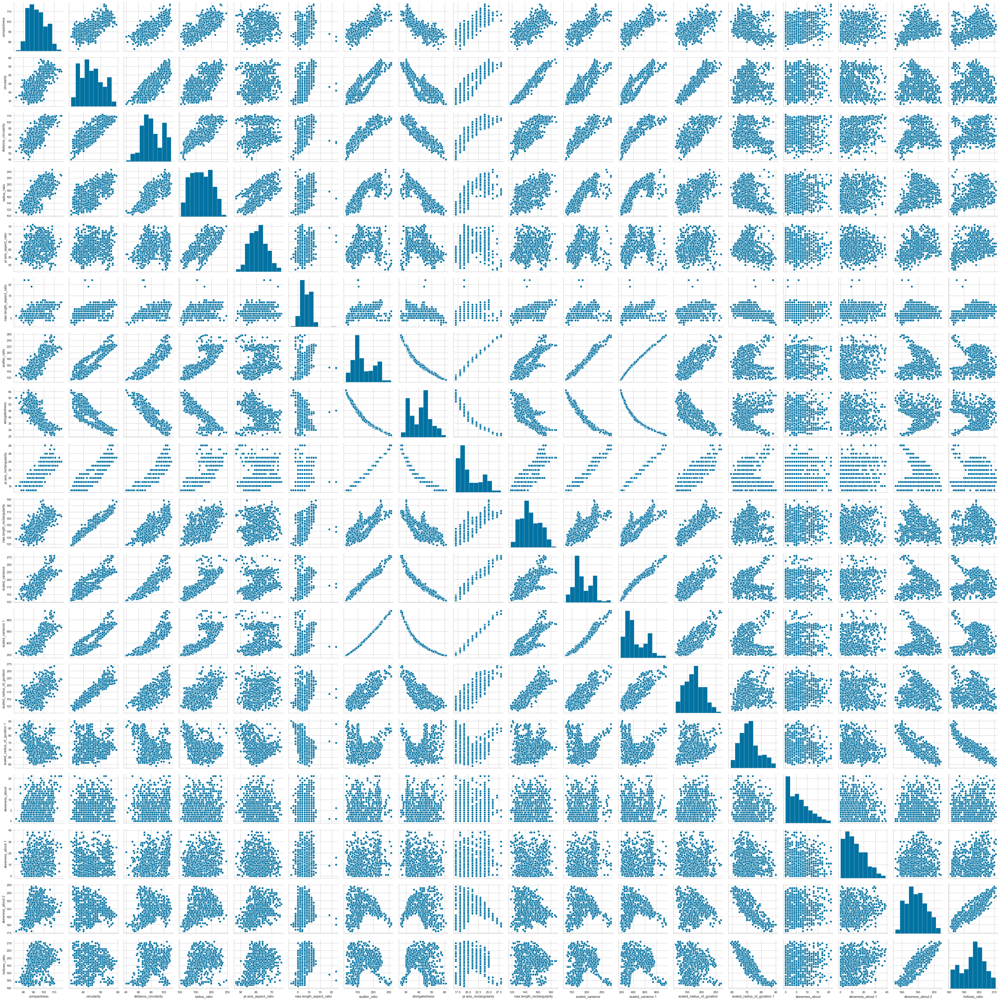

In [99]:
ds = X3.drop('class',axis=1)
sns.pairplot(ds);

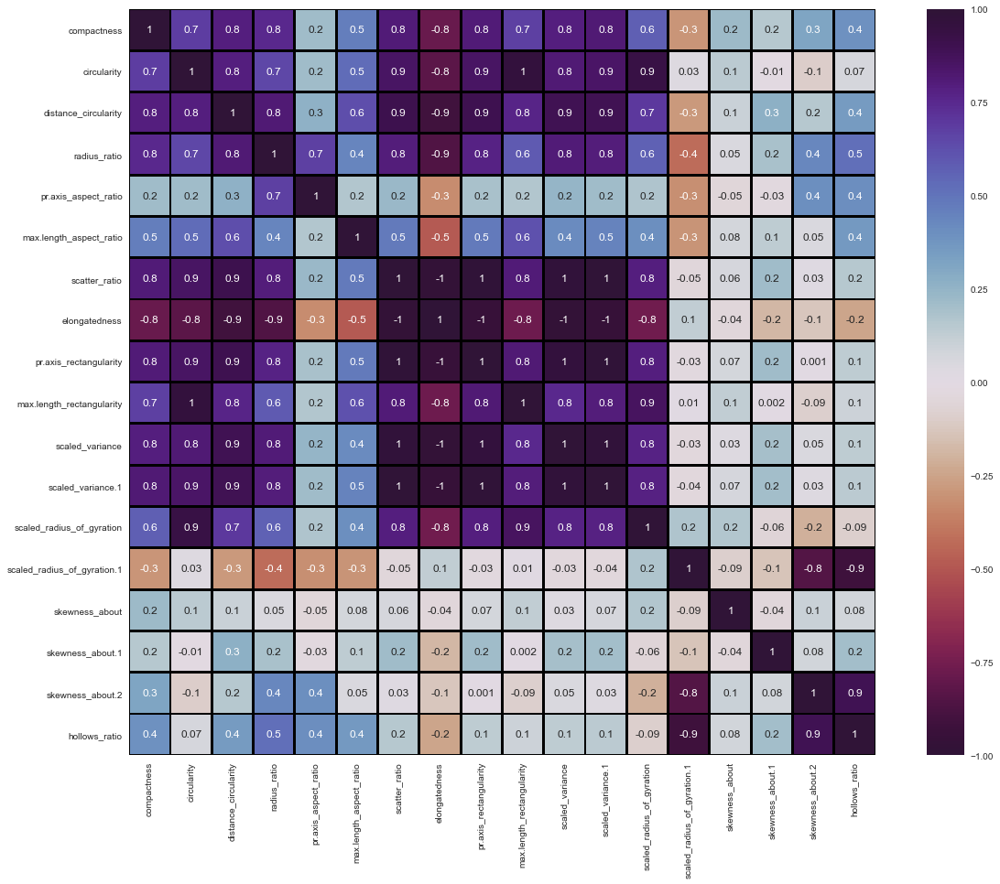

In [100]:
corrMat=ds.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corrMat, annot=True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'twilight_shifted_r', 
            linewidths=2, linecolor='black', square=True, );

From the above pairplot and correlation matrix we can observe that
- Strongest correlation of 1 and -1 is found between features scatter_ratio, elongatedness, pr.axis_rectangularity, scaled_variance and scaled_variance.1.
- Feature 'compactness' has fairly strong correlation of 0.8 with multiple features which include distance_circularity, radius_ratio, scatter_ratio, pr.axis_rectangularity, scaled_variance and scaled_variance.1. Also it has correlation of -0.8 with elogatedness.
- Feature 'circularity' has highest correlation of 1 with max.length_rectangularity and 0.9 with few other features.
- Also multiple correlation of 0.9 is observed between features.

#### Since multiple features are highly correlated with one another we face the risk of multicollinearity. We might have to fix this as we would not be able to distinguish between the individual effects of the independent variables on the dependent variable. This might lead to less accurate results,

### Applying SVM Classifier on all original data attributes

In [101]:
# Seperate dependent and independent features and Split the data into test and train

X_c = X2.iloc[:,0:18].values
y_c = X2.iloc[:,18].values

# Scaling independent data to acheive better results
sc = StandardScaler()
X_norm_c =  sc.fit_transform(X_c)

In [102]:
X_train_c,X_test_c,y_train_c,y_test_c, = train_test_split(X_norm_c,y_c,test_size=0.30,random_state=1)

# Fit the model
svm_c = SVC()
svm_c.fit(X_train_c,y_train_c)

# Predict y_c
y_c_predict = svm_c.predict(X_test_c)

In [103]:
print("SVM model score on complete dataset (train data):",svm_c.score(X_train_c, y_train_c))
print("SVM model score on complete dataset (test data) :",svm_c.score(X_test_c, y_test_c))
print('')
print("Confusion Matrix when SVM is applied on complete dataset:\n",metrics.confusion_matrix(y_c_predict,y_test_c))
print('')
print("Classification Report when SVM applied on complete dataset:\n",metrics.classification_report(y_c_predict,y_test_c))

SVM model score on complete dataset (train data): 0.9791666666666666
SVM model score on complete dataset (test data) : 0.9758064516129032

Confusion Matrix when SVM is applied on complete dataset:
 [[127   2   0]
 [  1  52   1]
 [  2   0  63]]

Classification Report when SVM applied on complete dataset:
               precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       129
         1.0       0.96      0.96      0.96        54
         2.0       0.98      0.97      0.98        65

    accuracy                           0.98       248
   macro avg       0.97      0.97      0.97       248
weighted avg       0.98      0.98      0.98       248



Observations from model score, confusion matrix and Classification report when SVM is fit on complete dataset:
- Model score is above 97.5% for both train and test data which is good. We can assume that data is neither underfitted nor overfitted.
- Precision is 98% when classifying cars and buses and 96% when classifying vans meaning the given percentage from total predicted values actually belong to the respective classes.
- Recall is 98%, 96%, 97% when classifying cars, buses and vans respectively meaning out of all the values that actually belong to a particular class, how much is predicted as that class.
- F1-score has similar percentage as precision to all the classes. The F1 score is the harmonic mean of precision and recall.
- Overall all the important scores are 96% and above which is really good.

### Dimensional reduction using PCA

PCA and other dimensional reduction techniques helps in reducing the dimensionality of the data (curse of dimensionality) resulting in the simpler model which is computationally efficient and provides greater generalization accuracy. It also help to counterfeit multicollinearity problems which we checked above.

Covariance is a measure of how much each of the dimensions vary from the mean with respect to each other.  N-dimensional data will result in NxN covariance matrix. Covariance calculations in PCA are used to find relationships between dimensions in high dimensional data sets where visualization is difficult.

In [104]:
# Covariance Matrix of 18*18 using Numpy function
cvar_mat = np.cov(X_norm_c.T)

print("Shape of Covariance Matrix:",cvar_mat.shape)
print('')
print("Covariance Matrix of shape 18*18:")
print(cvar_mat)

Shape of Covariance Matrix: (18, 18)

Covariance Matrix of shape 18*18:
[[ 1.00121507  0.68760984  0.79088732  0.75429058  0.2188329   0.46386185
   0.80971983 -0.78565349  0.81036414  0.67398599  0.79049507  0.81666528
   0.57466109 -0.29466716  0.21930668  0.15933944  0.31923498  0.39657645]
 [ 0.68760984  1.00121507  0.79624842  0.65303213  0.21857896  0.53822023
   0.85880372 -0.82578401  0.85727297  0.9674      0.81865114  0.85209484
   0.93609108  0.0334111   0.14209502 -0.01445726 -0.09581677  0.06637116]
 [ 0.79088732  0.79624842  1.00121507  0.82107504  0.26424847  0.62645618
   0.91174213 -0.91277799  0.90097771  0.77256635  0.89293933  0.89667074
   0.70236988 -0.28687917  0.10547948  0.26772416  0.16310862  0.35918209]
 [ 0.75429058  0.65303213  0.82107504  1.00121507  0.67417132  0.44279328
   0.80537799 -0.85420091  0.77926064  0.58819955  0.81273778  0.79784602
   0.56338873 -0.42820796  0.05163326  0.18903138  0.43410051  0.52148992]
 [ 0.2188329   0.21857896  0.2642484

The concept of Eigenvectors and Eigenvalues are used to determine a set of important variables (in form of vector) along with scale in different dimensions (key dimensions based on variance) for analysing the data in a better manner. In PCA, the eigenvalues and eigenvectors of features covariance matrix are found and further processed to determine top k eigenvectors based on the corresponding eigenvalues.

In [105]:
# Finding Eigen values and Eigen vectors
eigenvals, eigenvecs = np.linalg.eig(cvar_mat)

print('\n Eigen Values \n%s', eigenvals)
print('')
print('Eigen Vectors \n%s', eigenvecs)


 Eigen Values 
%s [9.87806536e+00 3.30700427e+00 1.19994010e+00 1.13028776e+00
 8.80651018e-01 6.65369588e-01 3.38122347e-01 2.27176287e-01
 1.17146195e-01 8.71299009e-02 6.08989879e-02 4.52206130e-02
 2.92628478e-02 2.15558108e-02 3.67089537e-04 6.14768868e-03
 1.24548560e-02 1.50704813e-02]

Eigen Vectors 
%s [[-2.70958425e-01 -8.81910084e-02  4.07518446e-02  1.45729119e-01
   1.57980800e-01  2.19742116e-01 -2.50296690e-01 -7.61613631e-01
   3.39321783e-01  1.73959600e-01 -5.97550913e-02 -1.67991797e-02
  -1.55009107e-01 -8.00659953e-02 -5.55417696e-04  1.36609895e-03
  -1.23928756e-02  1.04717910e-02]
 [-2.85326151e-01  1.48130264e-01  1.98757297e-01 -2.31459872e-02
  -1.25226348e-01 -2.09264049e-02  3.81528525e-01 -8.45038440e-02
   4.82642949e-02 -1.44860725e-01  5.88182148e-02  1.08723301e-01
  -2.41753304e-02  1.93743883e-01  1.77307117e-02  1.89614293e-01
  -6.30391802e-01  4.21194033e-01]
 [-3.00873064e-01 -4.00240786e-02 -7.63979779e-02  1.01956555e-01
  -7.45921380e-02  2.4

In [106]:
# Determining Eigen pairs
e_pairs = [(eigenvals[index], eigenvecs[:,index]) for index in range(len(eigenvals))]

# Sorting in descending order
e_pairs.sort()
e_pairs.reverse()
print(e_pairs)

[(9.878065360017075, array([-0.27095842, -0.28532615, -0.30087306, -0.27617725, -0.1076356 ,
       -0.18690554, -0.30928407,  0.30719714, -0.30621136, -0.27418979,
       -0.30248618, -0.30678346, -0.25854894,  0.06141815, -0.03768999,
       -0.05915873, -0.04775703, -0.09719076])), (3.3070042688686776, array([-0.08819101,  0.14813026, -0.04002408, -0.19254699, -0.24669265,
       -0.0685972 ,  0.07696751, -0.01834422,  0.08989364,  0.13566813,
        0.07258642,  0.07990205,  0.21829261,  0.50305501, -0.02939428,
       -0.09631384, -0.50744946, -0.5032683 ])), (1.1999401010858104, array([ 0.04075184,  0.1987573 , -0.07639798, -0.03878493,  0.10635688,
        0.10560191, -0.10770671,  0.09145792, -0.10617032,  0.20330636,
       -0.13453099, -0.10775511,  0.21513706, -0.0669313 ,  0.54352413,
       -0.68832344,  0.07300892,  0.03805273])), (1.1302877620768808, array([ 0.14572912, -0.02314599,  0.10195655, -0.2401678 , -0.60560842,
        0.24941845, -0.00146225,  0.07234186,  0.

In [107]:
# Extract Eigen values and Eigen vectors
eigvals_sort = [e_pairs[index][0] for index in range(len(eigenvals))]
eigvecs_sort = [e_pairs[index][1] for index in range(len(eigenvals))]

In [108]:
# Finding variance explained in percentage, 
tot = sum(eigenvals)

# Individual explained variance
var_exp = [(i / tot) for i in sorted(eigenvals, reverse=True)] 

# Cumulative explained variance
cvar_exp = np.cumsum(var_exp) 

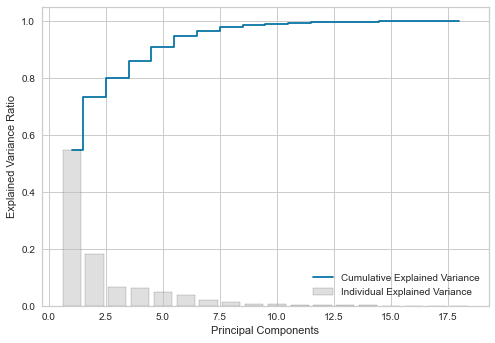

In [109]:
# Plotting explained variance
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.bar(range(1,19), var_exp, label='Individual Explained Variance', alpha=0.5, align='center', color='silver', edgecolor='black')
plt.step(range(1,19),cvar_exp, label='Cumulative Explained Variance', where= 'mid')
plt.legend(loc = 'best')
plt.show()

We can observe that 9 dimensions are able to explain 97% variance of data. Thus, we can use first 9 Principal Components to calulate on reduced dimensions.

In [110]:
# Reducing dimension space and projecting Original data into Principal Component dimensions
p_red = np.array(eigvecs_sort[0:9])   
X_9D = np.dot(X_norm_c,p_red.T)      

# Converting array to dataframe for pairplot
pca_red = pd.DataFrame(X_9D)  
pca_red

,0,1,2,3,4,5,6,7,8
0,-0.622275,-0.579690,0.453035,-0.773714,-0.914318,-1.715834,0.335515,-0.656985,0.435098
1,1.503678,-0.374948,0.201789,1.215114,-0.409422,-0.047851,-0.152188,0.142050,-0.102964
2,-3.986720,0.347528,1.191142,0.200862,0.777012,-0.738104,-0.749324,0.215058,0.281979
3,1.460597,-3.054606,0.419408,0.267554,-0.688707,0.431100,-0.120477,-0.172384,-0.180254
4,-6.055488,5.012014,-0.758869,0.236978,1.690376,2.303494,0.265691,0.268157,-0.208652
...,...,...,...,...,...,...,...,...,...
819,0.327750,-0.669050,-1.499738,0.215947,0.711466,-1.015983,-0.802028,0.261213,0.180907
820,0.035814,-0.090062,-0.618099,-0.376326,-1.936998,-1.200441,0.468850,-0.294776,-0.002687
821,-5.203679,0.042200,0.486573,-1.032759,-1.183617,0.334564,-0.836325,-0.366587,0.018352
822,3.261789,-1.183631,-1.944438,0.316582,-0.450186,0.047638,0.336948,0.428872,0.868505


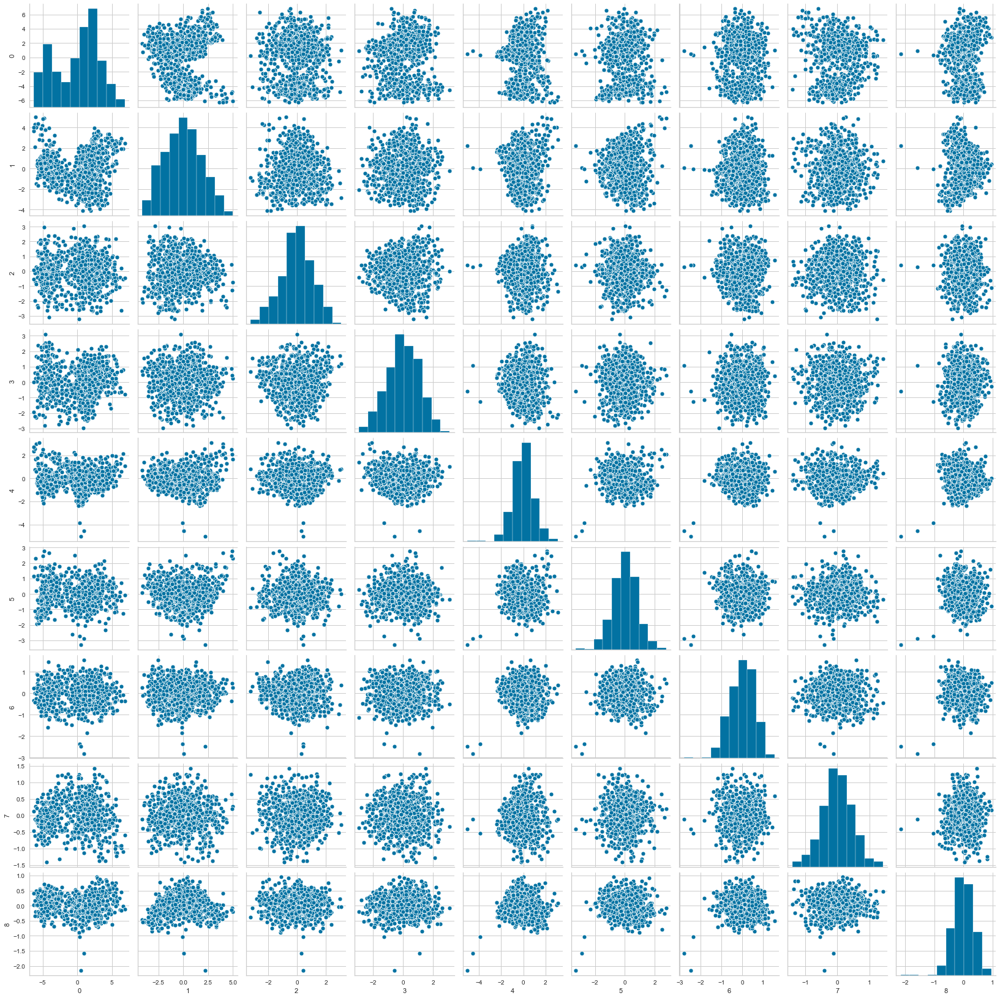

In [111]:
sns.pairplot(pca_red);

From the above pairplot we can observe that after using PCA for dimensionality reduction, most of our attributes have no correlation with others. 

### Applying SVM Classifier on reduced data attributes

In [112]:
# Split PCA dataset into train and test
X_train_r,X_test_r,y_train_r,y_test_r, = train_test_split(pca_red,y_c,test_size=0.30,random_state=1)

# Fit the model
svm_r = SVC()
svm_r.fit(X_train_r,y_train_r)

# Predict y_c
y_r_predict = svm_r.predict(X_test_r)

In [113]:
print("SVM model score on reduced dimensions dataset (train data):",svm_r.score(X_train_r, y_train_r))
print("SVM model score on reduced dimensions dataset (test data) :",svm_r.score(X_test_r, y_test_r))
print('')
print("Confusion Matrix when SVM is applied on reduced dimensions dataset:\n",metrics.confusion_matrix(y_r_predict,y_test_r))
print('')
print("Classification Report when SVM applied on reduced dimensions dataset:\n",metrics.classification_report(y_r_predict,y_test_r))

SVM model score on reduced dimensions dataset (train data): 0.96875
SVM model score on reduced dimensions dataset (test data) : 0.9556451612903226

Confusion Matrix when SVM is applied on reduced dimensions dataset:
 [[126   4   1]
 [  2  50   2]
 [  2   0  61]]

Classification Report when SVM applied on reduced dimensions dataset:
               precision    recall  f1-score   support

         0.0       0.97      0.96      0.97       131
         1.0       0.93      0.93      0.93        54
         2.0       0.95      0.97      0.96        63

    accuracy                           0.96       248
   macro avg       0.95      0.95      0.95       248
weighted avg       0.96      0.96      0.96       248



Observations from model score, confusion matrix and Classification report when SVM is fit on reduced dimensions dataset:
- Model score is above 95.5% for both train and test data when compared to 97.5% of complete dataset.
- Precision is 97% when classifying cars, 93% when classifying vans and 95% when classifying buses meaning the given percentage from total predicted values actually belong to the respective classes. Precision is 1%-3% less compared to the same when model is fit on complete dataset.
- Recall is 96%, 93%, 97% when classifying cars, buses and vans respectively meaning out of all the values that actually belong to a particular class, how much is predicted as that class. Recall is also 1%-3% less compared to the same when model is fit on complete dataset.
- F1-score has similar percentage as precision to all the classes. The F1 score is the harmonic mean of precision and recall.

#### Overall all the important scores are ranging between 93% and 97% which is really good taken into account that we have reduced the dimensions by almost a half of the original dataset. Some if the advantages of applying PCA to reduce dimensions include:
- Most of the correlated features are removed avoiding multicollinearity.
- Overfitting is reduced.
- Computaion speed is improved when applied on reduced dimensions.
- Visualization is easy on reduced dimensions.


## Part 4: Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

In [114]:
# imnporting dataset
rdf = pd.read_csv('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Project 4 - USML\\Part4 - ranking.csv')
rdf.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can observe that there are multiple rows with missing values in all the columns

In [115]:
print('Shape of data file is: {}'.format(rdf.shape))

Shape of data file is: (180, 7)


In [116]:
rdf.describe()

,Runs,Ave,SR,Fours,Sixes,HF
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
mean,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000
max,733.000000,81.330000,164.100000,73.000000,59.000000,9.000000


In [117]:
rdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


There are 90 missing values in all the columns. As observed above complete rows have missing values. We will drop these unwanted rows.

In [118]:
rdf1 = rdf.dropna(how = 'all')
rdf1 = rdf1.reset_index(drop=True)
rdf1.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0


In [119]:
rdf1.isna().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

Thus, all the missing rows and columns have been dropped. 

#### Outlier detection and treatment

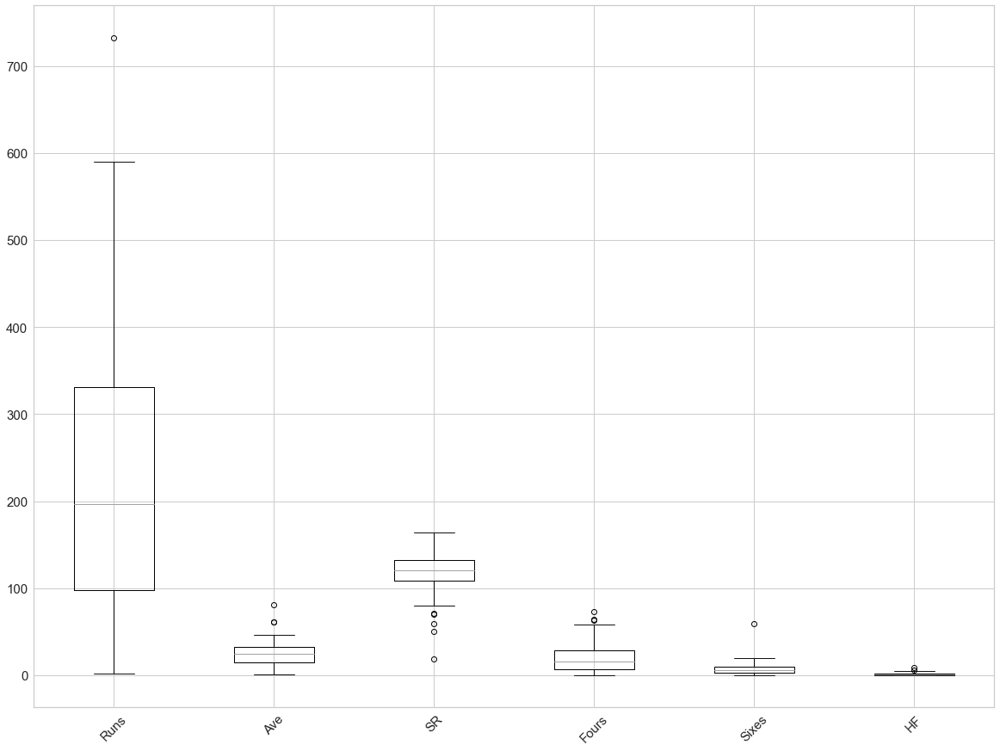

In [120]:
rdf1.boxplot(figsize=(20,15), rot=45, fontsize=15);

We can observe some outliers in few features. But if we eliminate those we might lose some important information as we have deali with ranking system using important features. Hence, we will proceed without outlier treatment.

In [121]:
#Scale and data and use for further analysis when required
rdf2 = rdf1.drop(['Name'], axis=1)
scaler = StandardScaler()
rdf3 =  scaler.fit_transform(rdf2)
rdf4 = pd.DataFrame(rdf3,columns=rdf2.columns)
rdf4.head()

,Runs,Ave,SR,Fours,Sixes,HF
0,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
1,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
2,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
3,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
4,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


### Data Visualization and Analysis

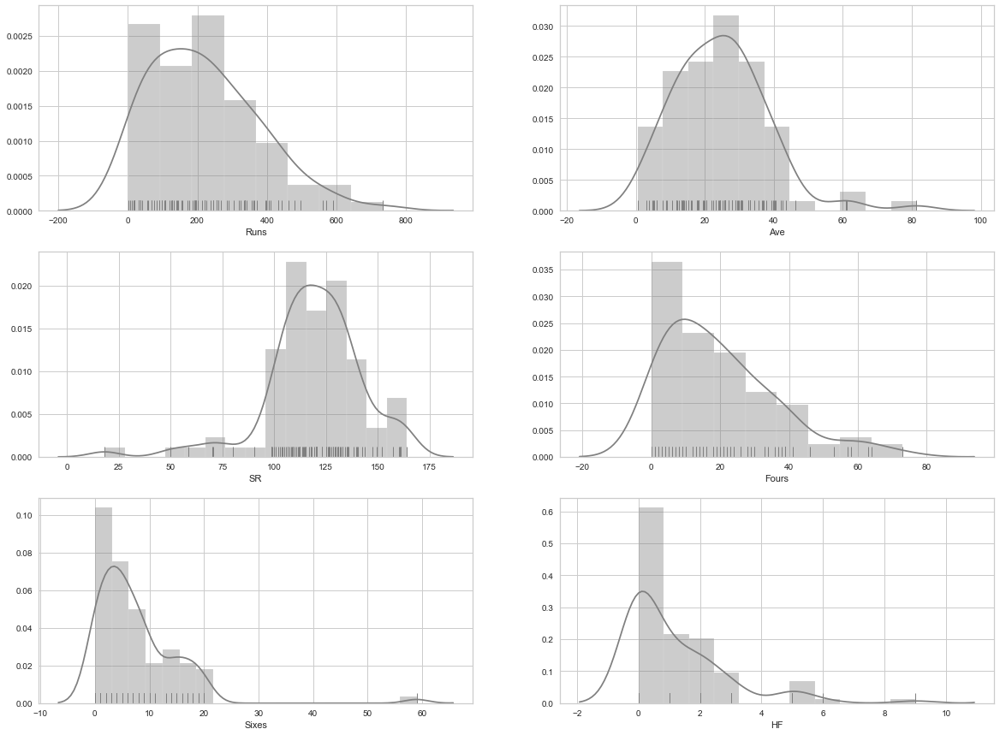

In [122]:
# Univariate Analysis

# Distribution all numerical columns

plt.figure(figsize= (20,15));

plt.subplot(3,2,1);
sns.distplot(rdf1['Runs'],rug=True,color='grey');

plt.subplot(3,2,2);
sns.distplot(rdf1['Ave'],rug=True,color='grey');

plt.subplot(3,2,3);
sns.distplot(rdf1['SR'],rug=True,color='grey');

plt.subplot(3,2,4);
sns.distplot(rdf1['Fours'],rug=True,color='grey');

plt.subplot(3,2,5);
sns.distplot(rdf1['Sixes'],rug=True,color='grey');

plt.subplot(3,2,6);
sns.distplot(rdf1['HF'],rug=True,color='grey');

As we can observe from the above plot, SR and Ave solumns seems to have normal distribution provided we eliminate outliers. All the other features like Runs, Fours, Sixes and HF are mostly right skewed.

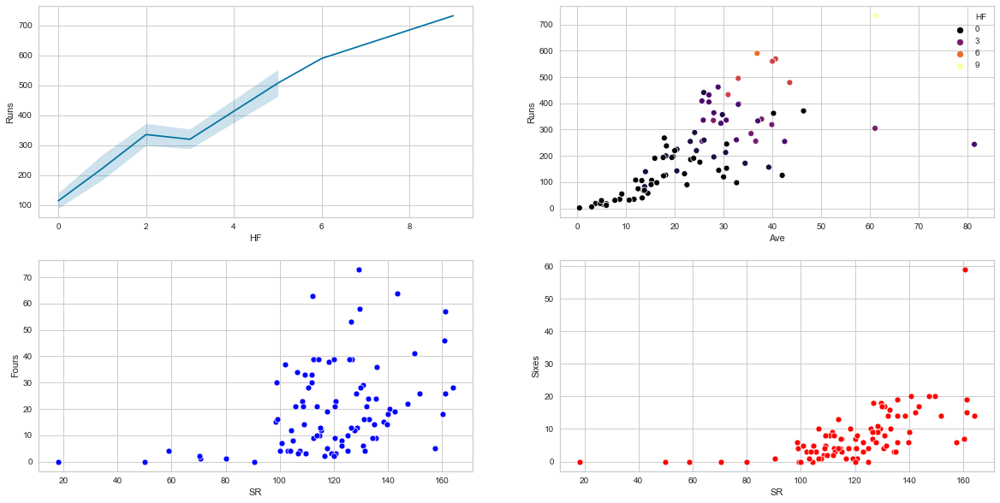

In [123]:
# Bivariate and Multivariate Analysis
plt.figure(figsize= (20,10));

plt.subplot(2,2,1);
sns.lineplot(data=rdf1, x="HF", y="Runs");

plt.subplot(2,2,2);
sns.scatterplot(data=rdf1, x="Ave", y="Runs", hue="HF", palette="inferno");

# 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

plt.subplot(2,2,3);
sns.scatterplot(data=rdf1, x="SR", y="Fours", color="blue");

plt.subplot(2,2,4);
sns.scatterplot(data=rdf1, x="SR", y="Sixes", color="red");

From the above observations we can see that:
- As the runs scored increases half centuries are also more. Hence thers is a close linear relationship between these features.
- When it comes to average, it increases as the runs scored increase, except for few points where even though average is high, runs scored are comparitively low. For these cases we can assume that the player must have played less matches.
- It is clear that when the player has scored more half centuries, the average is also high.
- Strike rate varies more when plotted against number of fours, as we can see points are scattered more when SR is more than 100.
- On contrast to fours, when SR is plotted against number of sixes, the points are more closer to each other when the SR exceeds 100.

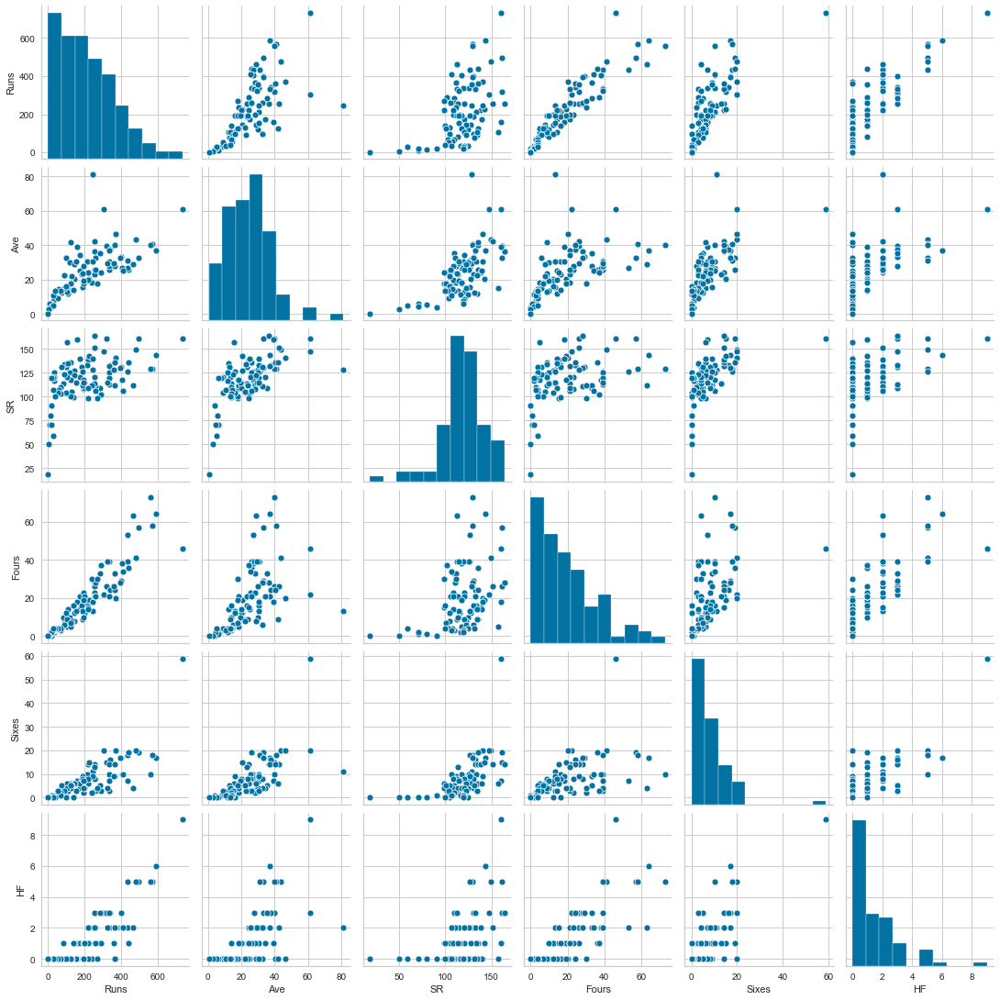

In [124]:
sns.pairplot(rdf1);

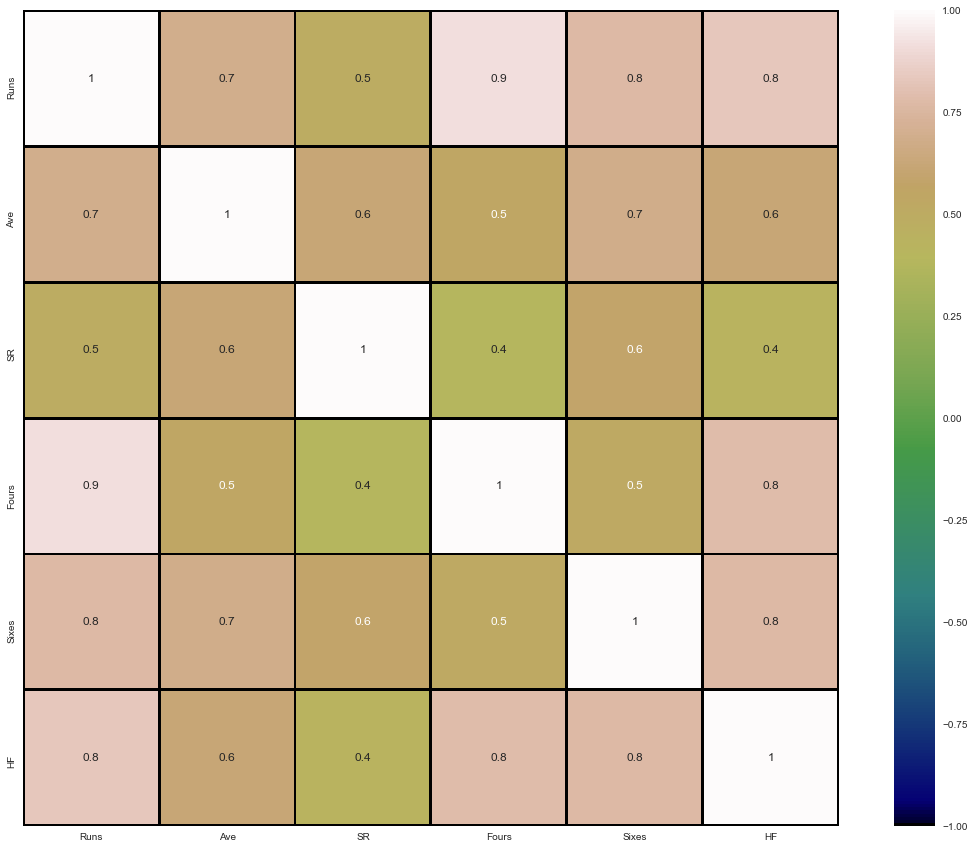

In [125]:
corrMat=rdf1.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corrMat, annot=True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'gist_earth', 
            linewidths=2, linecolor='black', square=True, );

Observations from pairplot and correlation matrix:
- There are multiple features which are closely related to each other, especially with Runs and HF.
- Strongest correlation is observed between Runs and number of fours which is 0.9.
- Fours and Sixes have correlation of 0.8 with both Runs and HF.
- Average and SR are less correlated with other features.

Define functions to rate players and rank based on these ratings

In [126]:
rdf_z = rdf2.apply(zscore)
# rdf_z

In [127]:
#Store mean and standard deviation values of every column
mean_Runs = rdf1['Runs'].mean()
mean_Ave = rdf1['Ave'].mean()
mean_SR = rdf1['SR'].mean()
mean_Fours = rdf1['Fours'].mean()
mean_Sixes = rdf1['Sixes'].mean()
mean_HF = rdf1['HF'].mean()

std_Runs = rdf1['Runs'].std()
std_Ave = rdf1['Ave'].std()
std_SR = rdf1['SR'].std()
std_Fours = rdf1['Fours'].std()
std_Sixes = rdf1['Sixes'].std()
std_HF = rdf1['HF'].std()

In [128]:
# Define functions to calculate ratings of each player
def Z_runs(x):
    Z1 = ((x - mean_Runs) / std_Runs) + 10
    return Z1

def Z_ave(x):
    Z2 = ((x - mean_Ave) / std_Ave) + 10
    return Z2

def Z_sr(x):
    Z3 = ((x - mean_SR) / std_SR) + 10
    return Z3

def Z_fours(x):
    Z4 = ((x - mean_Fours) / std_Fours) + 10
    return Z4

def Z_sixes(x):
    Z5 = ((x - mean_Sixes) / std_Sixes) + 10
    return Z5

def Z_hf(x):
    Z6 = ((x - mean_HF) / std_HF) + 10
    return Z6

In [129]:
rdf1['Z1'] = rdf1['Runs'].apply(lambda x: Z_runs(x))
rdf1['Z2'] = rdf1['Ave'].apply(lambda x: Z_ave(x))
rdf1['Z3'] = rdf1['SR'].apply(lambda x: Z_sr(x))
rdf1['Z4'] = rdf1['Fours'].apply(lambda x: Z_fours(x))
rdf1['Z5'] = rdf1['Sixes'].apply(lambda x: Z_sixes(x))
rdf1['Z6'] = rdf1['HF'].apply(lambda x: Z_hf(x))

In [130]:
# Calculate ratings
rdf1['Ratings'] = rdf1.Z1 * rdf1.Z2 * rdf1.Z3 * rdf1.Z4 * rdf1.Z5 * rdf1.Z6
rdf1['Ratings'] = rdf1['Ratings'] / 10000
rdf_f = rdf1.drop(['Z1','Z2', 'Z3', 'Z4', 'Z5', 'Z6'],axis=1)
# rdf_f

In [131]:
# Rank using the rating column
rdf_f['Ranking'] = rdf_f['Ratings'].rank(ascending=False)
rdf_f = rdf_f.sort_values(by = 'Ranking') 
rdf_f

,Name,Runs,Ave,SR,Fours,Sixes,HF,Ratings,Ranking
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,551.351812,1.0
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,270.947225,2.0
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,252.489976,3.0
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,243.688784,4.0
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,239.542243,5.0
...,...,...,...,...,...,...,...,...,...
86,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,44.281058,86.0
85,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,44.272170,87.0
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,42.557425,88.0
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,37.984804,89.0


In [132]:
rdf_f.to_excel('C:\\Users\\Rakesh Gowda S N\\Documents\\Projects\\Player Ranking.xlsx',index=False,sheet_name='Final data')

Thus Final rankings are determined based on ratings calculated using Z score.

## Part 5: Dimensionality Reduction Techniques

As we all know the data is incrementing day-by-day which inturn leads to an increase in dimensionality, which might result in complexity, overfitting and other issues. The increase in dimensions also results in increase in number of features and visualization will be diffcult when there are high number of features. When there are multiple features, there is a chance that some or most of these features being correlated which leads to multicollinearity.

So, when there are very high number of features in a dataset, it is a good practice to select the most informative and important features among them. This is where we use Dimensionality Reduction techniques. The benefits and importance of Dimensionality Reduction are:
- Multicollinearity is handled by removing redundant features.
- Performance of the algorithms are improved when performed on dimensionally reduced datasets.
- Reduced dimensions results in less storage space.
- Computation time is less when less data is used.
- Visualization becomes easier.

Some of the most commonly used Dimensionality techniques are:

1. Backward Feature Elimination: In Backward Feature Elimination technique, at a given iteration, the selected classification algorithm is trained on n input columns. Then we remove one input column at a time and train the same model on n-1 columns.  The input column whose removal has produced the smallest increase in the error rate is removed, leaving us with n-1 input columns. The classification is then repeated using n-2 columns, and so on. Each iteration k produces a model trained on n-k columns and an error rate e(k). By selecting the maximum tolerable error rate, we define the smallest number of columns necessary to reach that classification performance with the selected machine learning algorithm.

2. Forward Feature Elimination: This is the inverse process to backward feature elimination. We start with one column only, progressively adding one column at a time, i.e., the column that produces the highest increase in performance. Both algorithms, backward feature elimination and forward feature construction, are quite expensive in terms of time and computation. They are practical only when applied to a dataset with an already relatively low number of input columns.

3. Principal Component Analysis: Principal component analysis (PCA) is a statistical procedure that orthogonally transforms the original n numeric dimensions of a dataset into a new set of n dimensions called principal components. As a result of the transformation, the first principal component has the largest possible variance; each succeeding principal component has the highest possible variance under the constraint that it is orthogonal to (i.e., uncorrelated with) the preceding principal components. Keeping only the first m < n principal components reduces the data dimensionality while retaining most of the data information, i.e., variation in the data. Notice that the PCA transformation is sensitive to the relative scaling of the original columns, and therefore, the data need to be normalized before applying PCA. Also notice that the new coordinates (PCs) are not real, system-produced variables anymore. Applying PCA to your dataset loses its interpretability. If interpretability of the results is important for your analysis, PCA is not the transformation that you should apply.

4. Linear Discriminant Analysis: Linear Discriminant Analysis is a dimensionality reduction technique which is commonly used for the supervised classification problems. It is used for modeling differences in groups i.e. separating two or more classes. It is used to project the features in higher dimension space into a lower dimension space. A number m of linear combinations (discriminant functions) of the n input features, with m < n, are produced to be uncorrelated and to maximize class separation. These discriminant functions become the new basis for the dataset. All numeric columns in the dataset are projected onto these linear discriminant functions, effectively moving the dataset from the n-dimensionality to the m-dimensionality.

5. Random Forests: Decision tree ensembles, often called random forests, are useful for column selection in addition to being effective classifiers. Here we generate a large and carefully constructed set of trees to predict the target classes and then use each column’s usage statistics to find the most informative subset of columns. We generate a large set (2,000) of very shallow trees (two levels), and each tree is trained on a small fraction (three columns) of the total number of columns. If a column is often selected as the best split, it is very likely to be an informative column that we should keep. For all columns, we calculate a score as the number of times that the column was selected for the split, divided by the number of times in which it was a candidate. The most predictive columns are those with the highest scores.

6. Missing Value Ratio: Data columns with too many missing values are unlikely to carry much useful information. Thus, data columns with a ratio of missing values greater than a given threshold can be removed. The higher the threshold, the more aggressive the reduction.

7. Low Variance Filter: Similar to the previous technique, data columns with little changes in the data carry little information. Thus, all data columns with a variance lower than a given threshold can be removed. Notice that the variance depends on the column range, and therefore normalization is required before applying this technique.

8. High Correlation Filter: Data columns with very similar trends are also likely to carry very similar information, and only one of them will suffice for classification. Here we calculate the Pearson product-moment correlation coefficient between numeric columns and the Pearson’s chi-square value between nominal columns. For the final classification, we only retain one column of each pair of columns whose pairwise correlation exceeds a given threshold. Notice that correlation depends on the column range, and therefore, normalization is required before applying this technique.

9. Factor Analysis: Factor Analytics is a special technique reducing the huge number of variables into a few numbers of factors is known as factoring of the data, and managing which data is to be present in sheet comes under factor analysis. It is completely a statistical approach that is also used to describe fluctuations among the observed and correlated variables in terms of a potentially lower number of unobserved variables called factors. The factor analysis technique extracts the maximum common variance from all the variables and puts them into a common score. It is a theory that is used in training the machine learning model and so it is quite related to data mining. The belief behind factor analytic techniques is that the information gained about the interdependencies between observed variables can be used later to reduce the set of variables in a dataset.

While all of these techniques have their own benefits, most of these like PCA, Factor Analysis are not restricted to numeric columns only, instead we can use for reduction on images and texts as well. A practical example is illustrated below.

Original shape of the image is: (1080, 1920, 3)


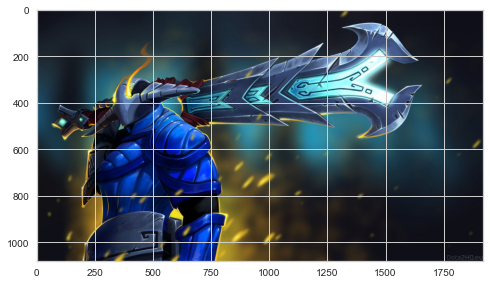

In [133]:
# Using PCA on image dataset
import matplotlib.image as mplib 
from PIL import Image

path = r'C:\Users\Rakesh Gowda S N\Downloads\Rogue Knight.jpg'

# Import image and show
img = mplib.imread(path)
print('Original shape of the image is: {}'.format(img.shape))
plt.imshow(img);

As shown above basically images will have Red, Blue and Green channels and each channel is of 1080 * 1920 matrix. We will work with grayscale image to avoid splitting RGB and working on 3 matrices.

Shape of the gray scale image is: (1080, 1920)


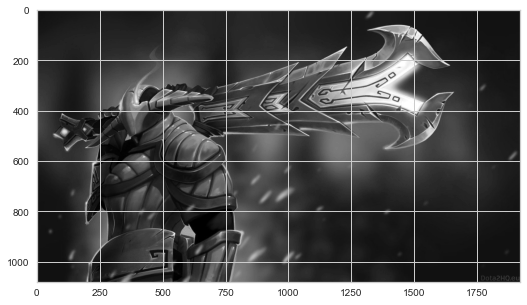

In [134]:
img_s = img.sum(axis=2)
print('Shape of the gray scale image is: {}'.format(img_s.shape))

img_g = img_s/img_s.max()
plt.figure(figsize=[10,5])
plt.imshow(img_g, cmap=plt.cm.gray);

Total number of components explaining 98% variance: 128


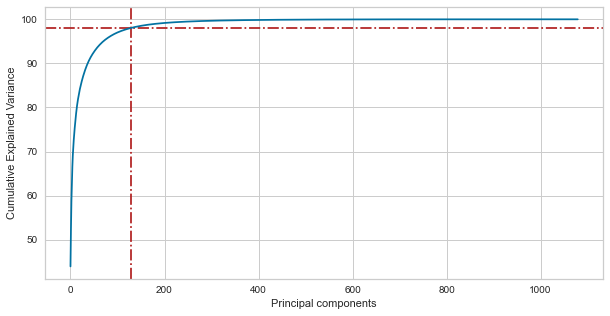

In [135]:
# Apply PCA on greyscale image

pca = PCA()
pca.fit(img_g)

# Check the Cumulative Variance and determine number of components explaining 95% variance
c_var = np.cumsum(pca.explained_variance_ratio_)*100
v98 = np.argmax(c_var>98)
print("Total number of components explaining 98% variance: "+ str(v98))

plt.figure(figsize=[10,5])
plt.xlabel('Principal components')
plt.ylabel('Cumulative Explained Variance')
plt.axvline(x=v98, color="firebrick", linestyle='dashdot')
plt.axhline(y=98, color="firebrick", linestyle='dashdot')
ax = plt.plot(c_var)

We can observe that instead of 1080 dimensions we can use 128 principal components with 95% variance. Now we will try to construct the image using 128 components. To find these 128 components we will use incremental PCA to fit transform and then use inverse transform to reconstruct the image.

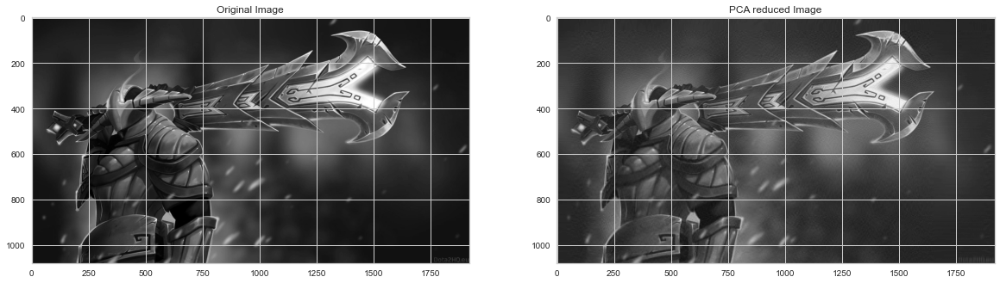

In [136]:
# Fit transform incremental PCA
ipca = IncrementalPCA(n_components=v98)
img98 = ipca.inverse_transform(ipca.fit_transform(img_g))

# Plot original image and reconstructed image

plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(img_g,cmap=plt.cm.gray);

plt.subplot(1,2,2)
plt.title("PCA reduced Image")
plt.imshow(img98,cmap=plt.cm.gray);

As we can observe in the above plots, for 98% variance most of the information and elements are retained. We will try will different number of components and see the difference.

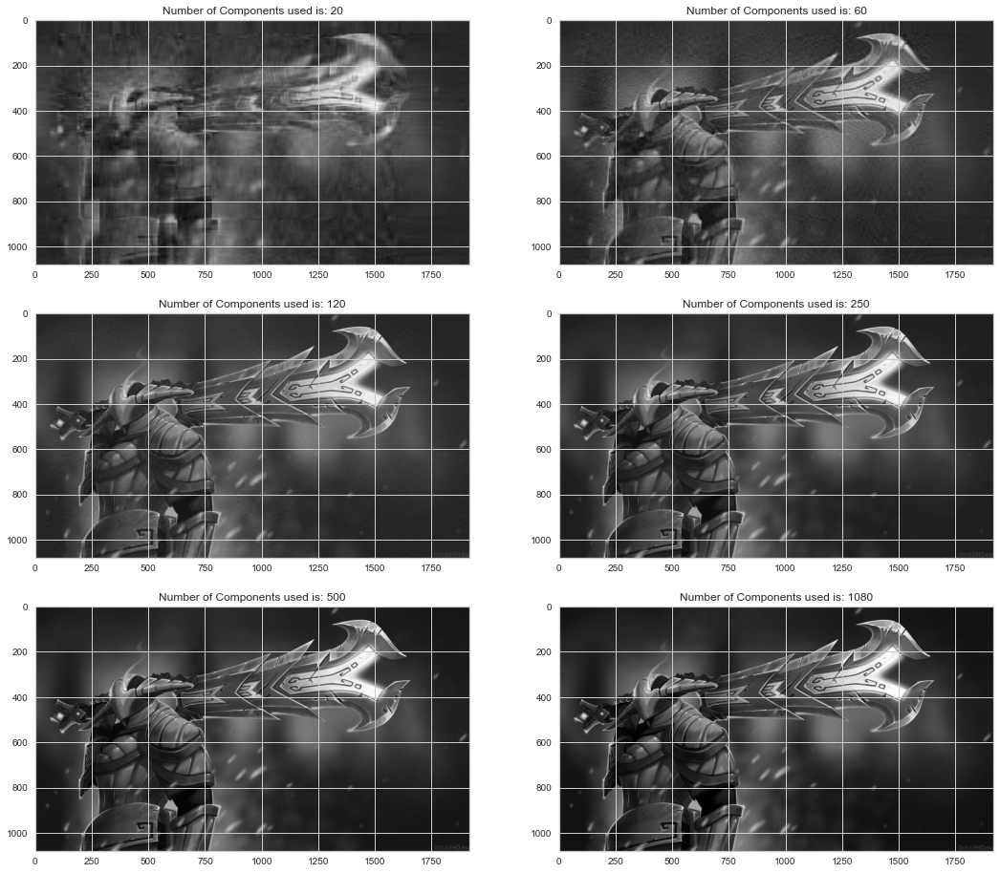

In [137]:
# Number of components
comp = [20, 60, 120, 250, 500, 1080]

# Function to fit transform with different number of PCs
def diff_no_of_comps(comp):
    ipca = IncrementalPCA(n_components=comp)
    img_new = ipca.inverse_transform(ipca.fit_transform(img_g))
    plt.imshow(img_new,cmap = plt.cm.gray)

#Plot with different number of PCs
plt.figure(figsize=[18,16])

for i in range(6):
    plt.subplot(3,2,i+1)
    diff_no_of_comps(comp[i])
    plt.title("Number of Components used is: "+str(comp[i]))

plt.subplots_adjust(hspace=0.2)
plt.show()

From the above images we can observe that most of the information is retained when PCs used are 120 and above. Thus, by reducing the components from 1080 to 120 using we can acheive a good and clear image where most of the important information is retained and hence when we perform algorithms on reduced data, storage space, computation time, complexity are reduced.